<a href="https://colab.research.google.com/github/micheldc55/Deep-Learning/blob/main/dcgan_caras_famosos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Adaptado de:
# https://github.com/naokishibuya/deep-learning/blob/master/python/dcgan_celeba.ipynb

# Generación de caras con GANs

In [ ]:
TRAIN    = True

COLAB    = True
GRAPHVIZ = True

In [ ]:
if COLAB:
    %tensorflow_version 1.x
    !pip install h5py==2.10.0

TensorFlow 1.x selected.
     |████████████████████████████████| 2.9 MB 8.3 MB/s 
  Attempting uninstall: h5py
    Found existing installation: h5py 3.1.0
    Uninstalling h5py-3.1.0:
      Successfully uninstalled h5py-3.1.0


In [ ]:
import numpy as np
from glob import glob
from tqdm import tqdm
import tensorflow as tf
import keras
import keras.backend as K
from keras.initializers import RandomNormal
from keras.layers import Dense, Activation, LeakyReLU, BatchNormalization
from keras.layers import Conv2D, Conv2DTranspose, Reshape, Flatten
from keras.models import Sequential
from keras.optimizers import Adam
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
%matplotlib inline

Using TensorFlow backend.


## Leer base de datos

In [ ]:
if COLAB:
    try:
        from google_drive_downloader import GoogleDriveDownloader as gdd
    except:
        !pip install googledrivedownloader
        from google_drive_downloader import GoogleDriveDownloader as gdd
    
    gdd.download_file_from_google_drive(file_id='1JLrGRDrbk1EHh8bMKWP7A-6Cu_RGIJxC',
                                        dest_path='./caras.zip', unzip=True)

Unzipping...Done.


In [ ]:
!pwd

/content


In [ ]:
filenames = np.array(glob('./caras/famosos/*.jpg'))
filenames

array(['./caras/famosos/Alvaro_Uribe_0017.jpg',
       './caras/famosos/Arnold_Palmer_0002.jpg',
       './caras/famosos/Jackie_Chan_0006.jpg', ...,
       './caras/famosos/Carlos_Alberto_0001.jpg',
       './caras/famosos/Adam_Scott_0001.jpg',
       './caras/famosos/Carlos_Alberto_Parreira_0001.jpg'], dtype='<U53')

Let's examine some sample images.

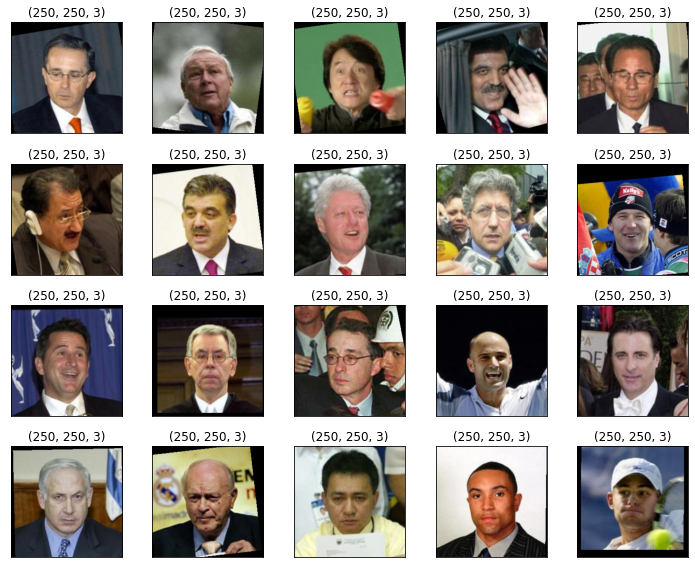

In [ ]:
plt.figure(figsize=(10, 8))
for i in range(20):
    img = plt.imread(filenames[i])
    plt.subplot(4, 5, i+1)
    plt.imshow(img)
    plt.title(img.shape)
    plt.xticks([])
    plt.yticks([])
plt.tight_layout()

In [ ]:
X_train, X_test = train_test_split(filenames, test_size=200)

In [ ]:
print(X_train.shape)
print(X_test.shape)

(883,)
(200,)


## Preprocessing and Deprocessing

Those images are pretty big.  I'll crop and resize.

In [ ]:
from PIL import Image

def load_image(filename, size=(32, 32)):
    img = np.array(Image.open(filename))
    # crop
    rows, cols = img.shape[:2]
    crop_r, crop_c = 150, 150
    start_row, start_col = (rows - crop_r) // 2, (cols - crop_c) // 2
    end_row, end_col = rows - start_row, cols - start_row
    img = img[start_row:end_row, start_col:end_col, :]
    # resize
    img = np.array(Image.fromarray(img).resize(size))
    return img

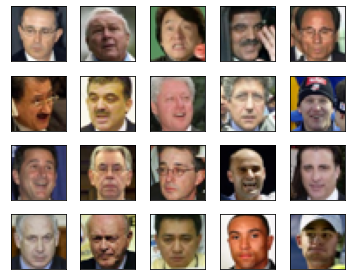

In [ ]:
plt.figure(figsize=(5, 4))
for i in range(20):
    img = load_image(filenames[i])
    plt.subplot(4, 5, i+1)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
plt.tight_layout()

As usual, we need preprocessing and later deprocessing of the images.  

As we will see later on, the generator is using `tanh` activation, for which we need to preprocess the image data into the range between -1 and 1.

In [ ]:
def preprocess(x):
    return 2*(x/255)-1   # Entre -1 y 1

def deprocess(x):
    return np.uint8((x+1)/2*255) # Volver a llevarlo a un valore entre 0 y 255. Make sure to use uint8 type otherwise the image won't display properly

## Generator

The generator takes a latent sample (100 randomly generated numbers) and produces a color face image that should look like one from the CelebA dataset.

In [ ]:
def make_generator(input_size, leaky_alpha, init_stddev):
    model = Sequential()
    model.add(Dense(512*4*4, input_shape=(input_size,)))
    model.add(Reshape(target_shape=(4,4,512))) # 512 imgs de 4x4
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=leaky_alpha))
    model.add(Conv2DTranspose(256, kernel_size=5, strides=2, # upsampling + convolución
                              padding='same',
                              kernel_initializer=RandomNormal(stddev=init_stddev)
                             )) #  256 imgs de 8x8 capa equivalente a: capa de UpSampling + capa de Convolución
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=leaky_alpha))
    model.add(Conv2DTranspose(128, kernel_size=5, strides=2,
                              padding='same',
                              kernel_initializer=RandomNormal(stddev=init_stddev)
                             )) #  128 imgs de 16x16 capa equivalente a: capa de UpSampling + capa de Convolución
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=leaky_alpha))
    model.add(Conv2DTranspose(3, kernel_size=5, strides=2,
                              padding='same',
                              kernel_initializer=RandomNormal(stddev=init_stddev)
                             )) #  3 imgs de 32x32 capa equivalente a: capa de UpSampling + capa de Convolución
    model.add(Activation('tanh'))
    
    return model


## Discriminator

The discriminator is a classifier to tell if the input image is real or fake.  

In [ ]:
def make_discriminator(leaky_alpha, init_stddev):
    model = Sequential()
    model.add(Conv2D(64, kernel_size=5, strides=2,
                     padding='same', input_shape=(32,32,3),
                     kernel_initializer=RandomNormal(stddev=init_stddev)))
    model.add(LeakyReLU(alpha=leaky_alpha))
    model.add(Conv2D(128, kernel_size=5, strides=2,
                     padding='same',
                     kernel_initializer=RandomNormal(stddev=init_stddev)))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=leaky_alpha))
    model.add(Conv2D(256, kernel_size=5, strides=2,
                     padding='same',
                     kernel_initializer=RandomNormal(stddev=init_stddev)))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=leaky_alpha))
    model.add(Flatten())
    model.add(Dense(1,
                    kernel_initializer=RandomNormal(stddev=init_stddev)))
    model.add(Activation('sigmoid'))
    
    return model


## DCGAN

We connect the generator and the discriminator to make a DCGAN.

In [ ]:
# beta_1 is the exponential decay rate for the 1st moment estimates in Adam optimizer
def make_DCGAN(sample_size, 
               g_learning_rate, 
               g_beta_1,
               d_learning_rate,
               d_beta_1,
               leaky_alpha,
               init_std):
    # generator
    generator = make_generator(sample_size, leaky_alpha, init_std)

    # discriminator
    discriminator = make_discriminator(leaky_alpha, init_std)
    discriminator.compile(optimizer=Adam(lr=d_learning_rate, beta_1=d_beta_1), loss='binary_crossentropy')
    
    # GAN
    gan = Sequential([generator, discriminator])
    gan.compile(optimizer=Adam(lr=g_learning_rate, beta_1=g_beta_1), loss='binary_crossentropy')
    
    return gan, generator, discriminator

## Training DCGAN

The below is a list of utility functions.

In [ ]:
def make_latent_samples(n_samples, sample_size):
    #return np.random.uniform(-1, 1, size=(n_samples, sample_size))
    return np.random.normal(loc=0, scale=1, size=(n_samples, sample_size))

def make_trainable(model, trainable):
    for layer in model.layers:
        layer.trainable = trainable
        
def make_labels(size):
    return np.ones([size, 1]), np.zeros([size, 1])

def show_losses(losses):
    losses = np.array(losses)
    
    fig, ax = plt.subplots()
    plt.plot(losses.T[0], label='Discriminator')
    plt.plot(losses.T[1], label='Generator')
    plt.title("Validation Losses")
    plt.legend()
    plt.show()

def show_losses_and_errors(losses, errors):
    losses = np.array(losses)
    errors = np.array(errors)
    
    plt.figure(figsize=(15,5))
    plt.subplot(1,2,1)
    plt.plot(losses.T[0], label='Discriminator')
    plt.plot(losses.T[1], label='Generator')
    plt.title("Validation Losses")
    plt.legend()
    plt.subplot(1,2,2)
    plt.plot(errors.T[0], label='Discriminator')
    plt.plot(errors.T[1], label='Generator')
    plt.title("Validation Errors")
    plt.legend()
    plt.show()

def show_images(generated_images, cols=10):
    n_images = len(generated_images)
    rows = n_images//cols
    
    plt.figure(figsize=(10, 8))
    for i in range(n_images):
        img = deprocess(generated_images[i])
        ax = plt.subplot(rows, cols, i+1)
        plt.imshow(img)
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout()
    plt.show()

### Training

Smaller learning rate for the generater and a bigger learning rate for the discriminator.

In [ ]:
g_learning_rate=0.0001
g_beta_1=0.5
d_learning_rate=0.001
d_beta_1=0.5
leaky_alpha=0.2
init_std=0.02


smooth=0.1
sample_size=100 # latent sample size (i.e. 100 random numbers)
epochs=100 # 3
batch_size=16 # 128  # train batch size
eval_size=16    # evaluate size

# labels for the batch size and the test size
y_train_real, y_train_fake = make_labels(batch_size)
y_eval_real,  y_eval_fake  = make_labels(eval_size)

# create a GAN, a generator and a discriminator
gan, generator, discriminator = make_DCGAN(
    sample_size, 
    g_learning_rate, 
    g_beta_1,
    d_learning_rate,
    d_beta_1,
    leaky_alpha,
    init_std)

losses = []
errors = []

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 8192)              827392    
_________________________________________________________________
reshape_1 (Reshape)          (None, 4, 4, 512)         0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 4, 4, 512)         2048      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 4, 4, 512)         0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 8, 8, 256)         3277056   
_________________________________________________________________
batch_normalization_2 (Batch (None, 8, 8, 256)         1024      
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 8, 8, 256)        

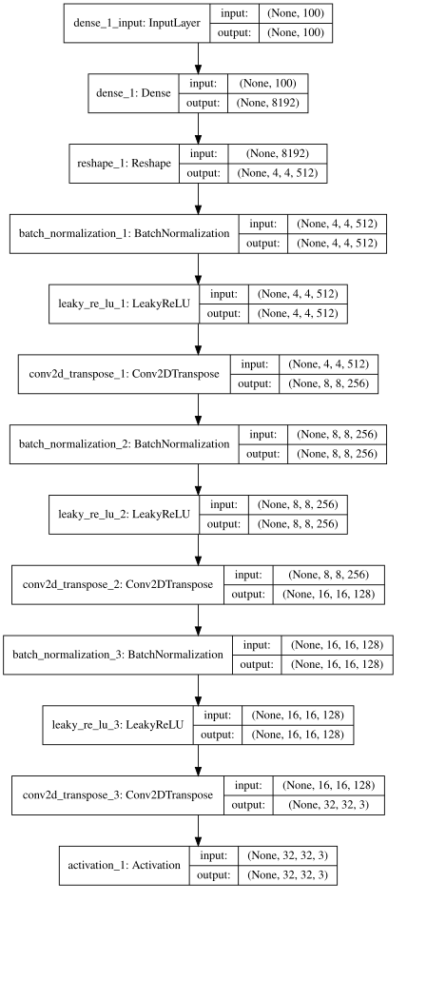

In [ ]:
print(generator.summary())
if GRAPHVIZ:
    from IPython.display import SVG,display
    from keras.utils.vis_utils import model_to_dot
    if COLAB:
        display(SVG(model_to_dot(generator,show_shapes=True,dpi=64).create(prog='dot', format='svg')))
    else:
        display(SVG(model_to_dot(generator,show_shapes=True).create(prog='dot', format='svg')))

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 16, 16, 64)        4864      
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 8, 8, 128)         204928    
_________________________________________________________________
batch_normalization_4 (Batch (None, 8, 8, 128)         512       
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 4, 4, 256)         819456    
_________________________________________________________________
batch_normalization_5 (Batch (None, 4, 4, 256)        

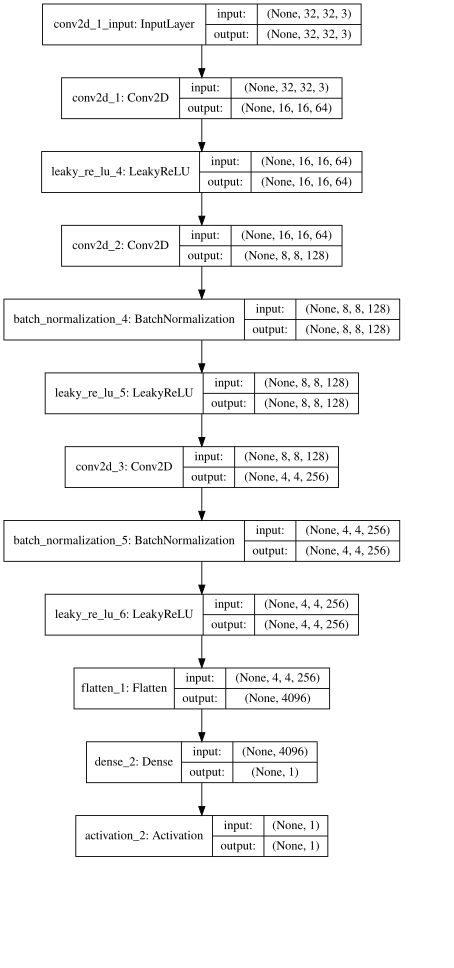

In [ ]:
print(discriminator.summary())
if GRAPHVIZ:
    if COLAB:
        display(SVG(model_to_dot(discriminator,show_shapes=True,dpi=64).create(prog='dot', format='svg')))
    else:
        display(SVG(model_to_dot(discriminator,show_shapes=True).create(prog='dot', format='svg')))

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_1 (Sequential)    (None, 32, 32, 3)         4936963   
_________________________________________________________________
sequential_2 (Sequential)    (None, 1)                 1034881   
Total params: 5,971,844
Trainable params: 5,969,284
Non-trainable params: 2,560
_________________________________________________________________
None


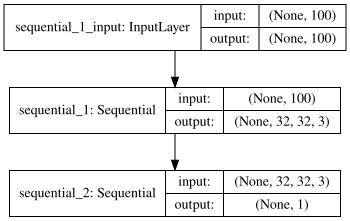

In [ ]:
print(gan.summary())
if GRAPHVIZ:
    if COLAB:
        display(SVG(model_to_dot(gan,show_shapes=True,dpi=72).create(prog='dot', format='svg')))
    else:
        display(SVG(model_to_dot(gan,show_shapes=True).create(prog='dot', format='svg')))

  0%|          | 0/55 [00:00<?, ?it/s]

/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
  2%|▏         | 1/55 [00:06<06:00,  6.68s/it]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:10<00:00,  5.40it/s]


Epoch:   1/100 Discriminator Loss: 1.3740 Generator Loss: 0.5170


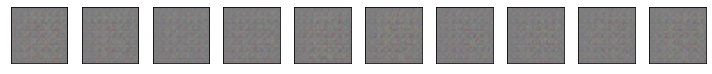

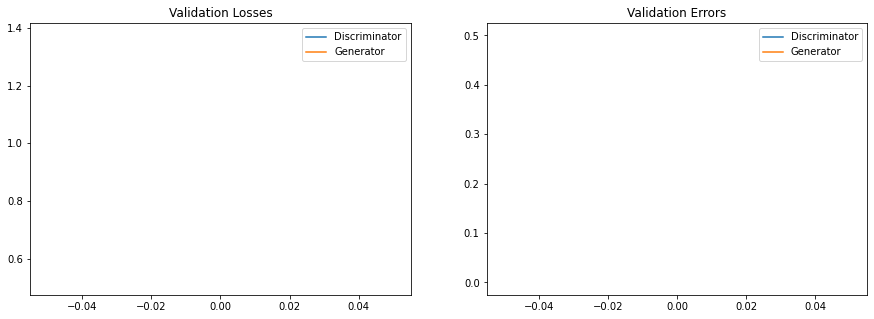

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:03<00:00, 14.70it/s]


Epoch:   2/100 Discriminator Loss: 1.6551 Generator Loss: 0.2816


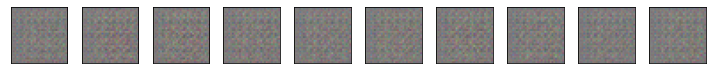

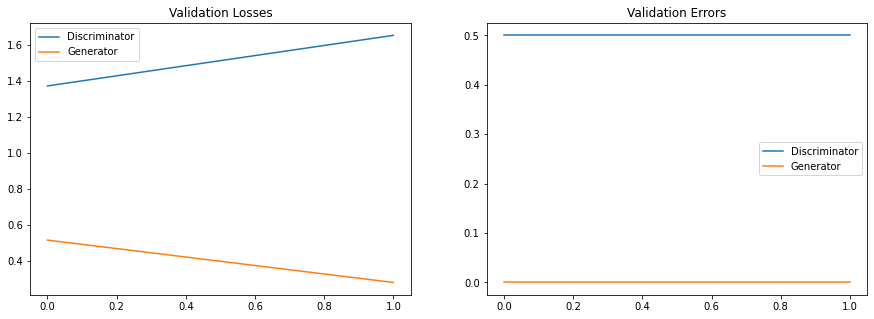

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:03<00:00, 15.01it/s]


Epoch:   3/100 Discriminator Loss: 1.8494 Generator Loss: 0.2023


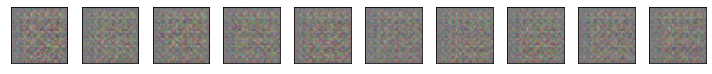

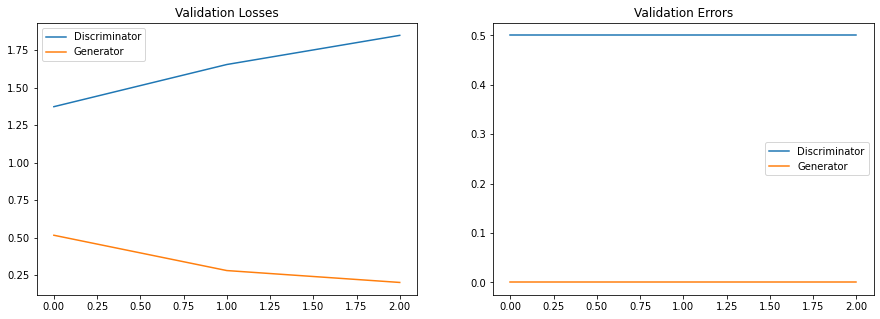

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:03<00:00, 15.21it/s]


Epoch:   4/100 Discriminator Loss: 0.0023 Generator Loss: 7.5534


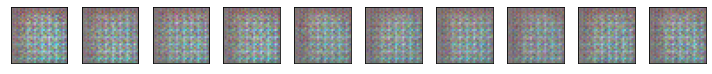

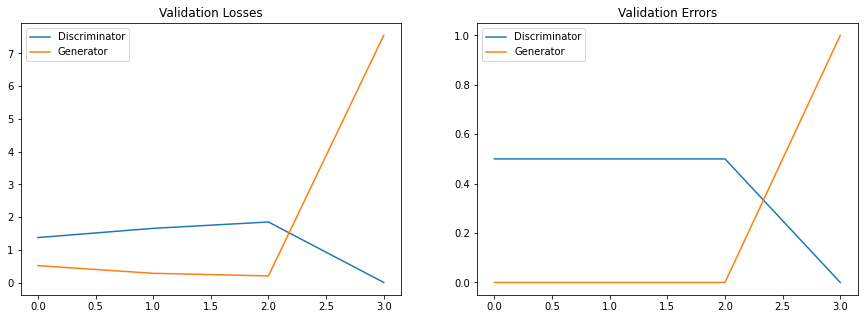

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:03<00:00, 14.69it/s]


Epoch:   5/100 Discriminator Loss: 0.8639 Generator Loss: 0.8308


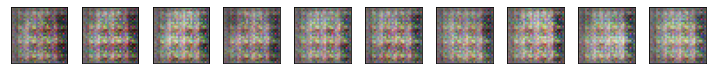

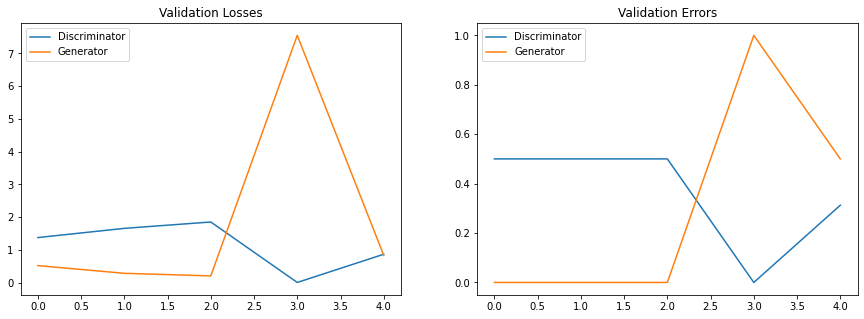

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:03<00:00, 14.64it/s]


Epoch:   6/100 Discriminator Loss: 1.3471 Generator Loss: 2.4317


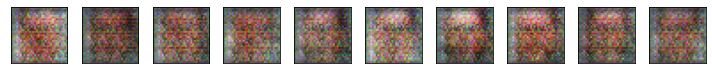

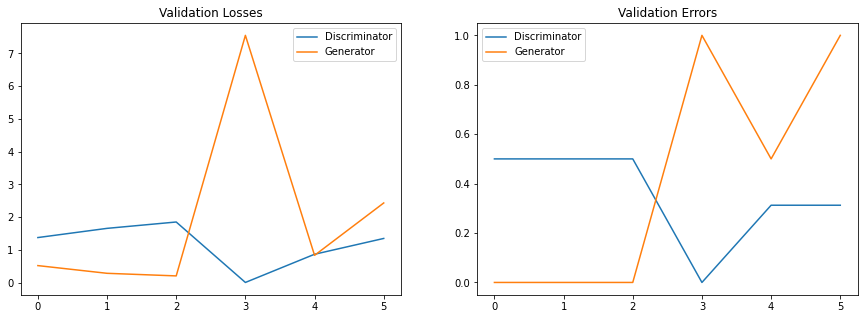

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:03<00:00, 15.25it/s]


Epoch:   7/100 Discriminator Loss: 1.3806 Generator Loss: 0.5898


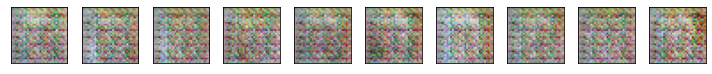

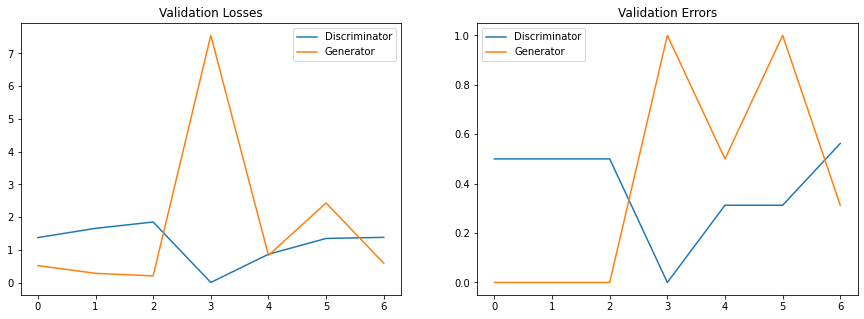

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:03<00:00, 14.72it/s]


Epoch:   8/100 Discriminator Loss: 0.7643 Generator Loss: 1.6651


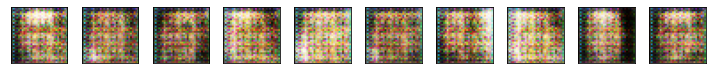

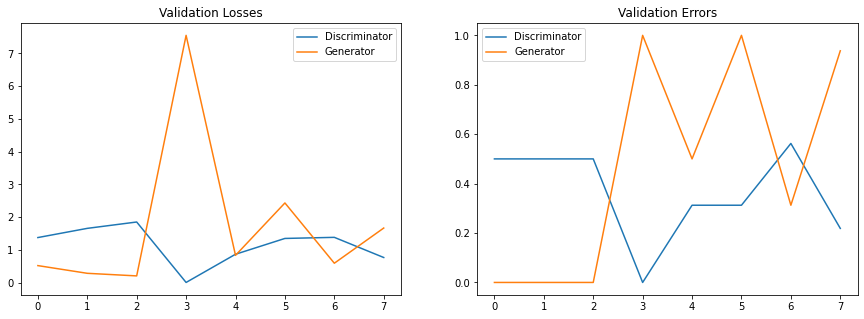

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:03<00:00, 14.80it/s]


Epoch:   9/100 Discriminator Loss: 0.7030 Generator Loss: 1.2573


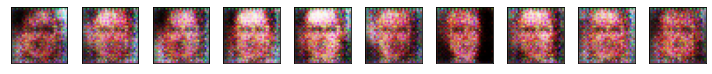

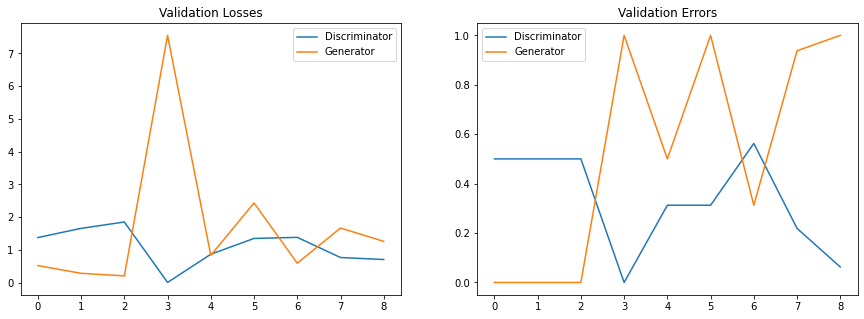

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:03<00:00, 14.88it/s]


Epoch:  10/100 Discriminator Loss: 1.0430 Generator Loss: 1.2253


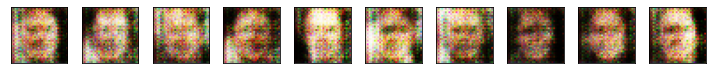

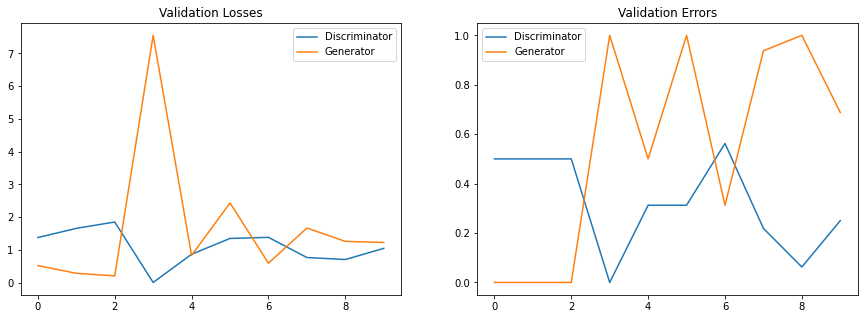

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:03<00:00, 14.57it/s]


Epoch:  11/100 Discriminator Loss: 1.2497 Generator Loss: 1.1921


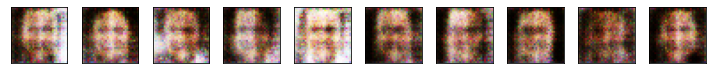

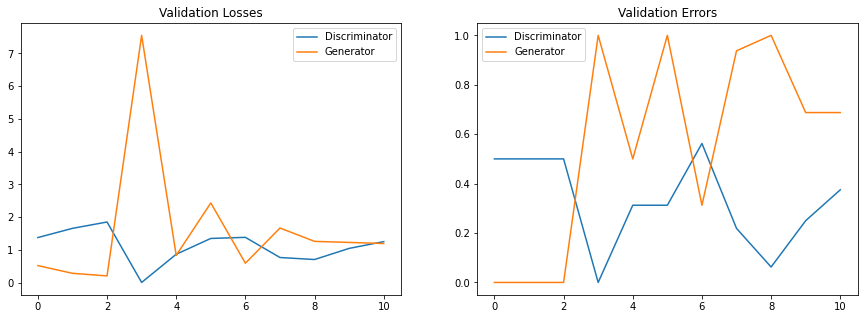

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:03<00:00, 14.54it/s]


Epoch:  12/100 Discriminator Loss: 0.9967 Generator Loss: 1.3538


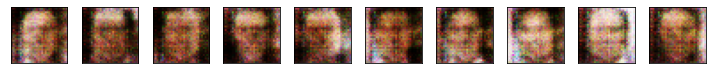

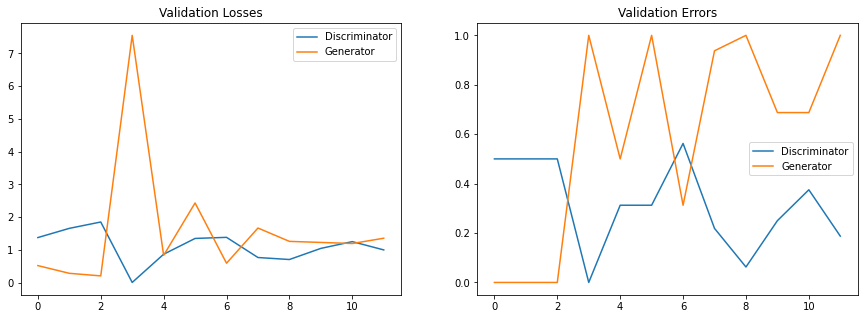

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:03<00:00, 14.52it/s]


Epoch:  13/100 Discriminator Loss: 1.5772 Generator Loss: 0.4050


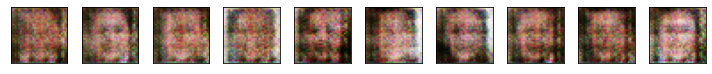

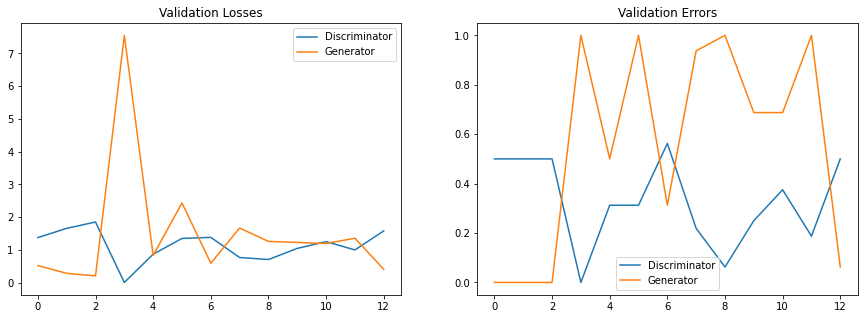

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:03<00:00, 14.65it/s]


Epoch:  14/100 Discriminator Loss: 0.6145 Generator Loss: 1.6545


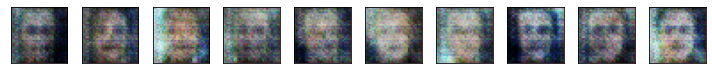

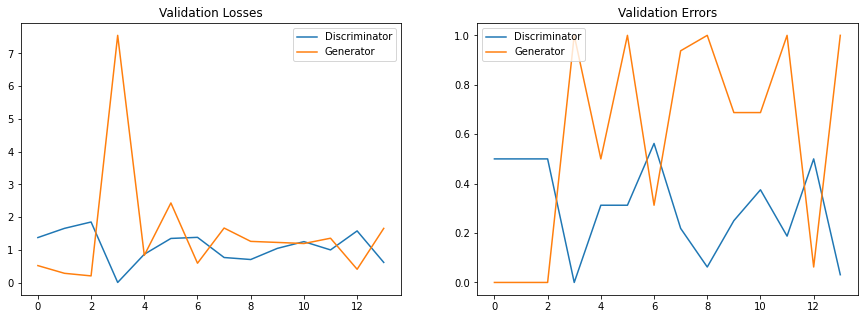

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:03<00:00, 13.94it/s]


Epoch:  15/100 Discriminator Loss: 1.6133 Generator Loss: 0.5443


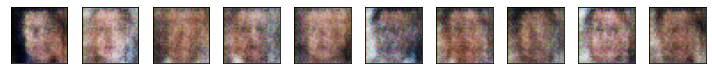

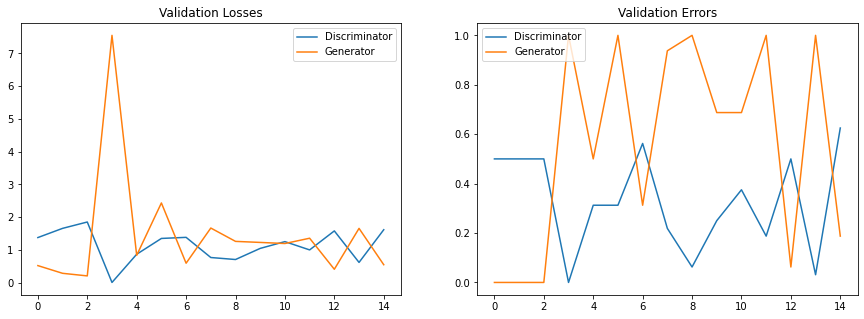

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:03<00:00, 14.14it/s]


Epoch:  16/100 Discriminator Loss: 1.0684 Generator Loss: 1.8167


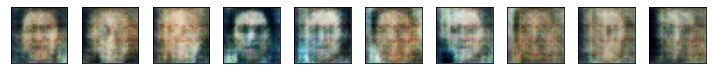

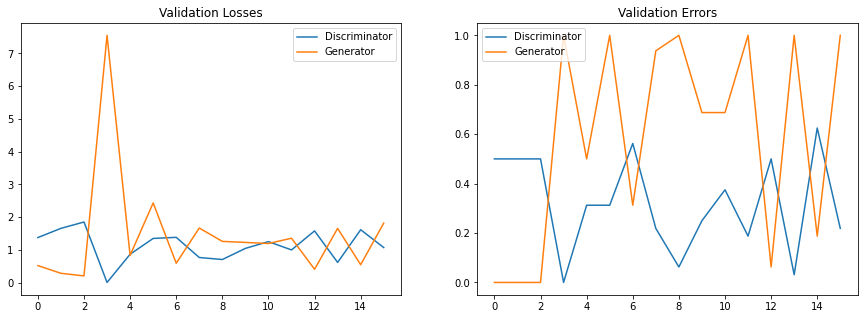

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:03<00:00, 13.91it/s]


Epoch:  17/100 Discriminator Loss: 0.6935 Generator Loss: 1.8165


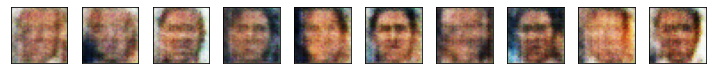

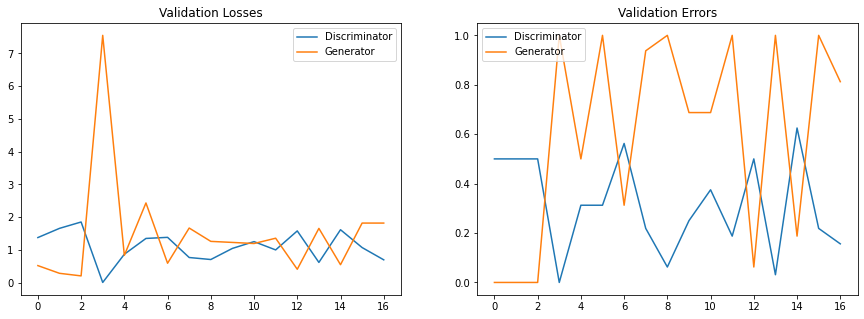

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:03<00:00, 14.49it/s]


Epoch:  18/100 Discriminator Loss: 0.8463 Generator Loss: 1.2199


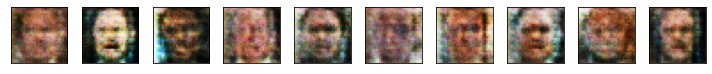

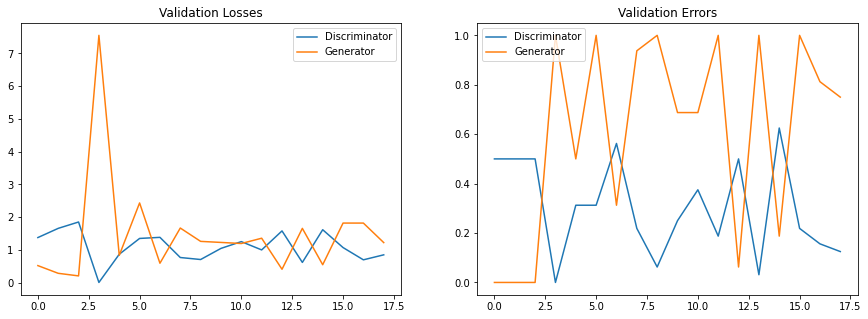

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:03<00:00, 14.02it/s]


Epoch:  19/100 Discriminator Loss: 0.6518 Generator Loss: 2.2602


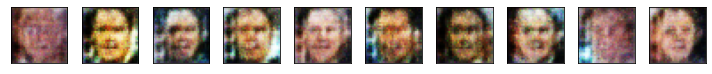

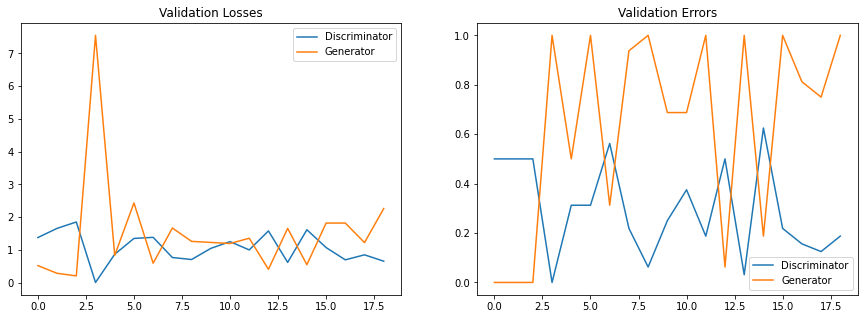

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 13.59it/s]


Epoch:  20/100 Discriminator Loss: 0.8890 Generator Loss: 1.2773


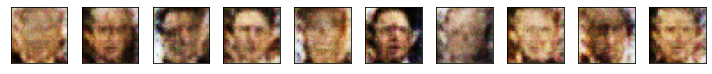

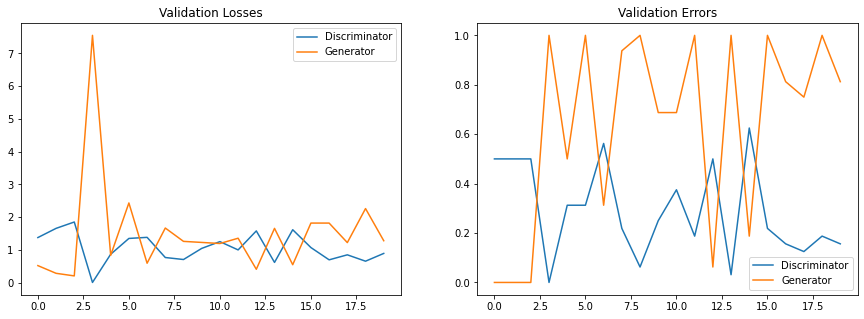

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 13.74it/s]


Epoch:  21/100 Discriminator Loss: 1.0920 Generator Loss: 4.0380


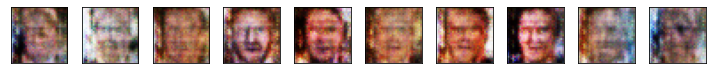

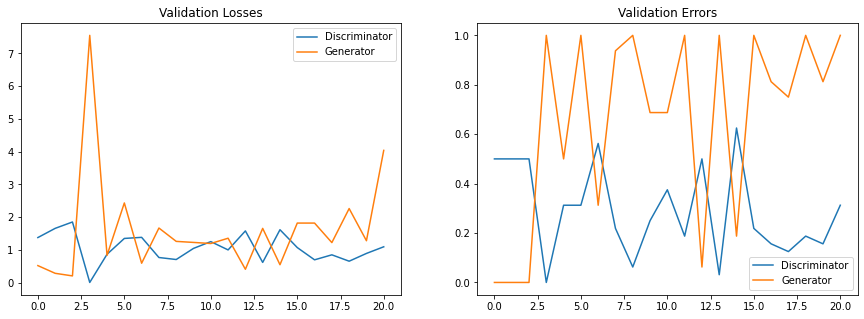

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 13.41it/s]


Epoch:  22/100 Discriminator Loss: 0.9322 Generator Loss: 1.4072


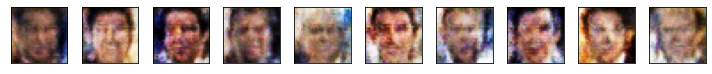

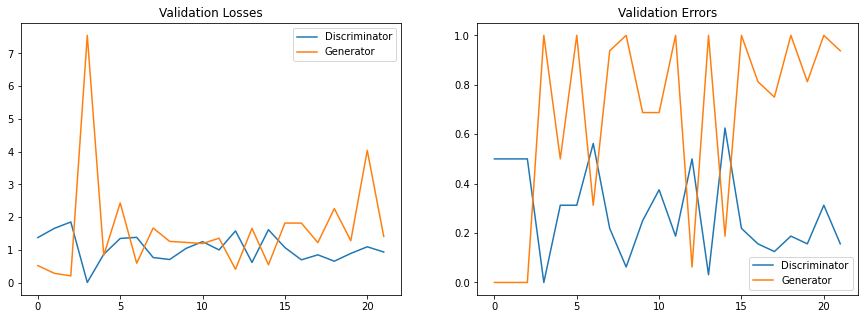

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 13.53it/s]


Epoch:  23/100 Discriminator Loss: 0.7917 Generator Loss: 2.1627


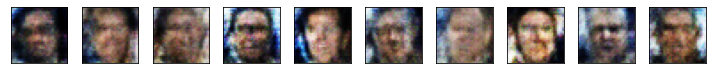

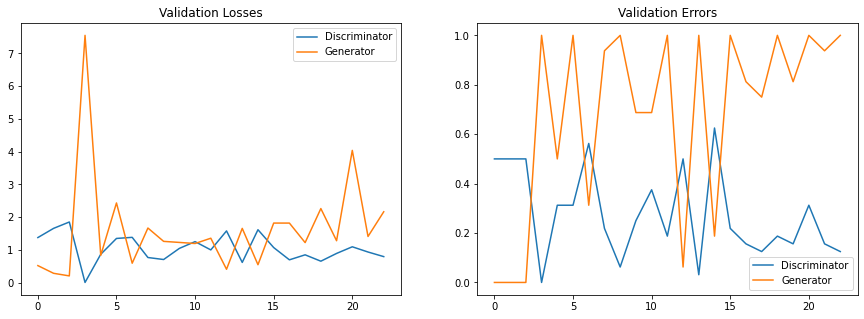

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 13.60it/s]


Epoch:  24/100 Discriminator Loss: 0.8294 Generator Loss: 2.4946


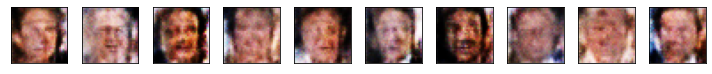

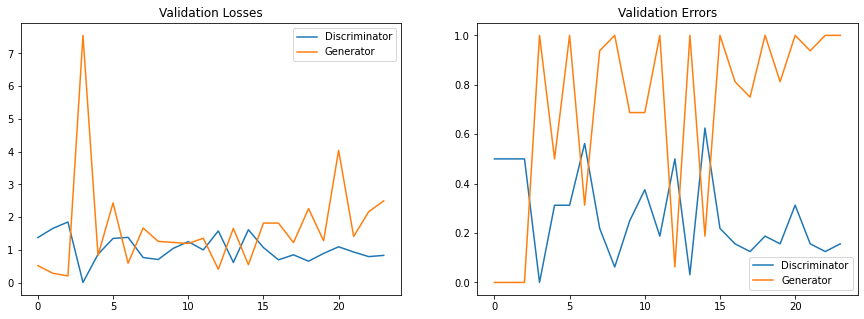

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 13.54it/s]


Epoch:  25/100 Discriminator Loss: 1.4319 Generator Loss: 2.8770


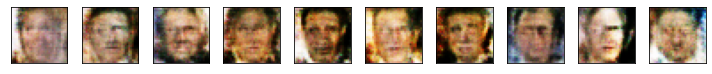

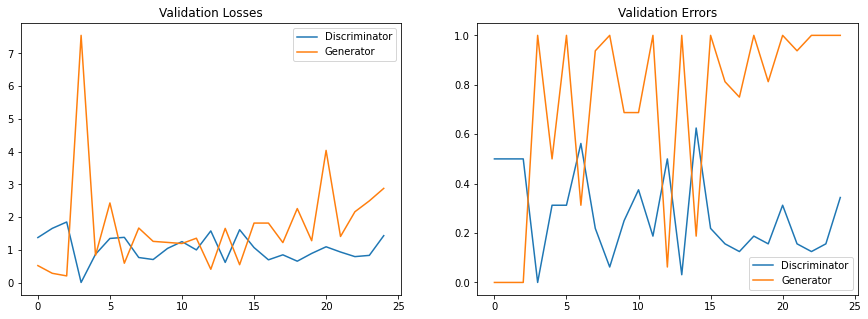

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 13.43it/s]


Epoch:  26/100 Discriminator Loss: 1.1989 Generator Loss: 1.2920


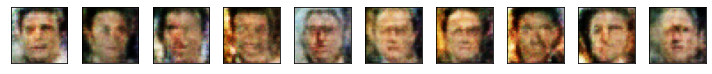

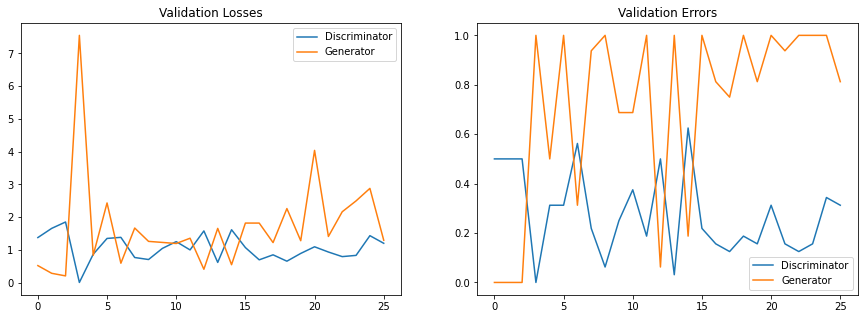

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 13.59it/s]


Epoch:  27/100 Discriminator Loss: 0.9952 Generator Loss: 1.9379


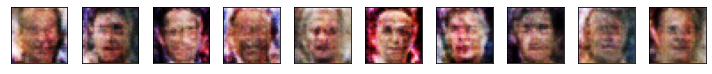

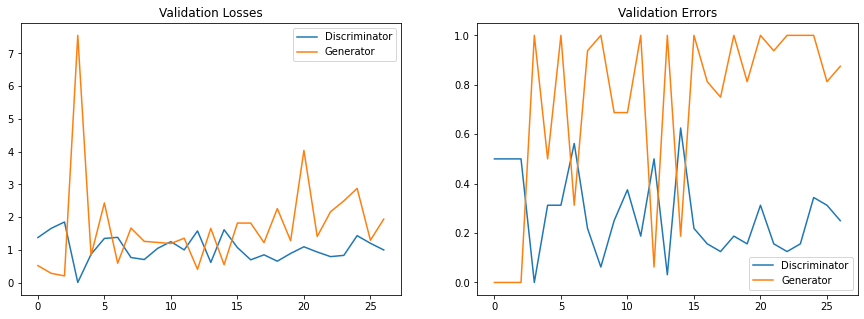

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 13.21it/s]


Epoch:  28/100 Discriminator Loss: 1.3734 Generator Loss: 2.4226


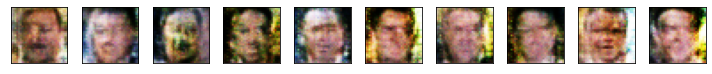

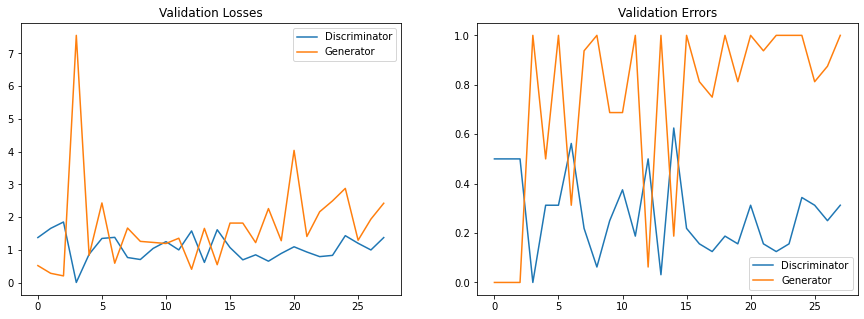

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 13.29it/s]


Epoch:  29/100 Discriminator Loss: 2.0174 Generator Loss: 3.5498


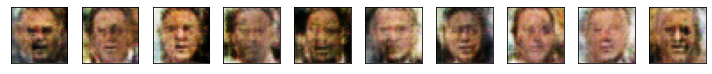

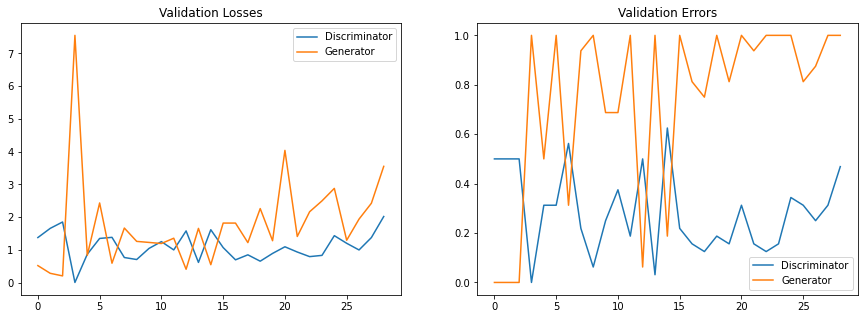

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 13.07it/s]


Epoch:  30/100 Discriminator Loss: 1.6955 Generator Loss: 3.3201


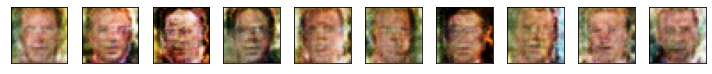

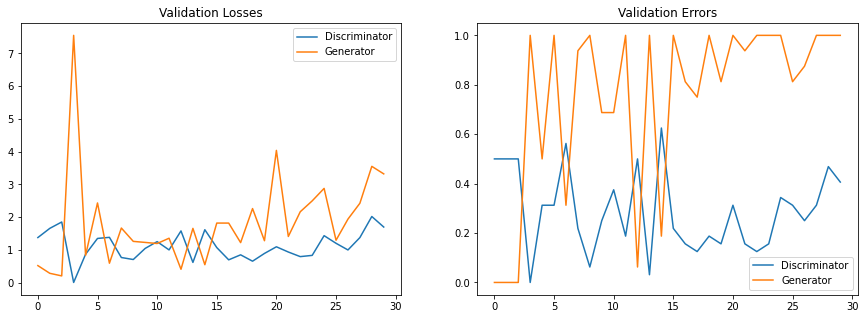

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 13.41it/s]


Epoch:  31/100 Discriminator Loss: 1.8795 Generator Loss: 2.7251


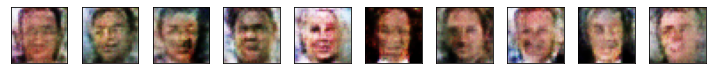

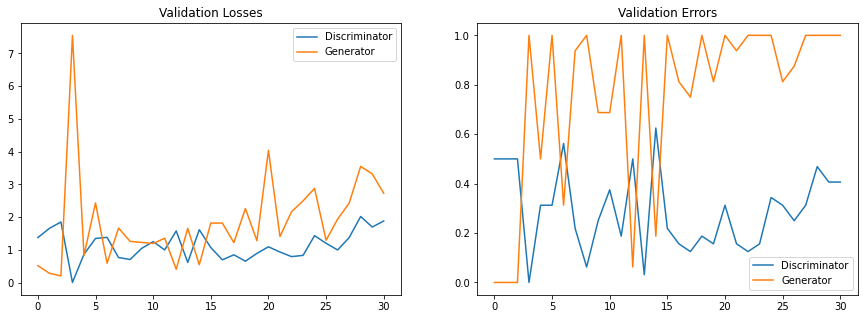

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 13.17it/s]


Epoch:  32/100 Discriminator Loss: 1.8696 Generator Loss: 1.2370


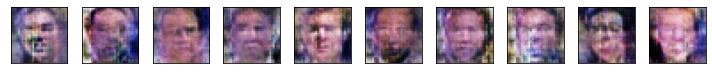

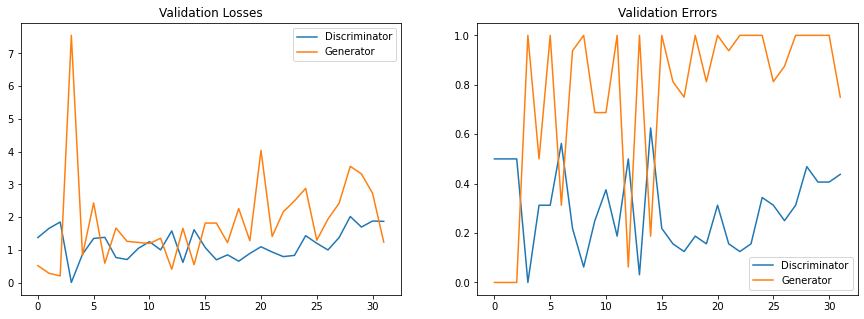

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 12.68it/s]


Epoch:  33/100 Discriminator Loss: 0.9773 Generator Loss: 2.5807


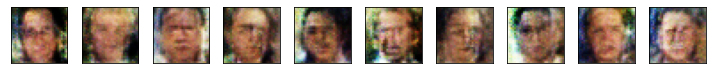

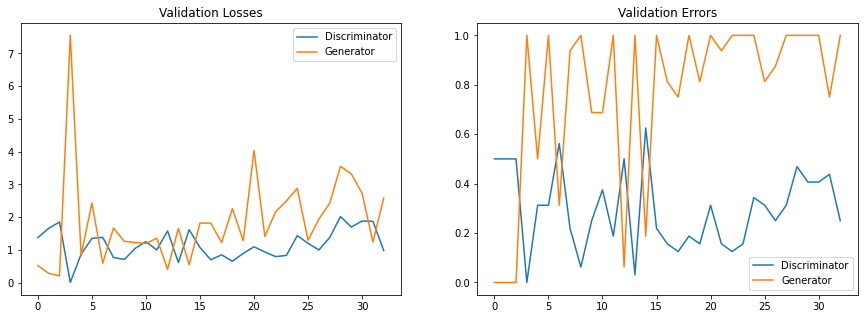

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 13.00it/s]


Epoch:  34/100 Discriminator Loss: 0.8577 Generator Loss: 2.0136


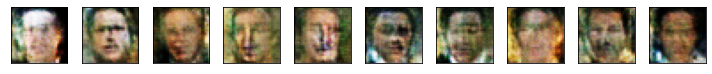

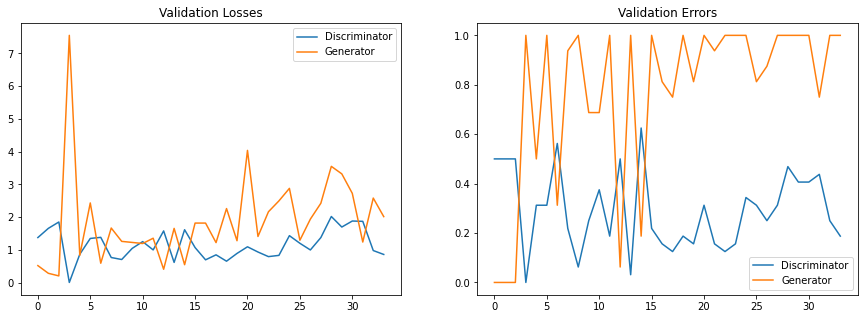

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 13.00it/s]


Epoch:  35/100 Discriminator Loss: 1.3544 Generator Loss: 2.6207


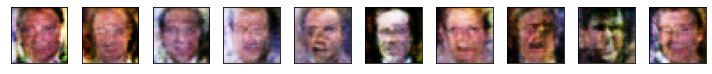

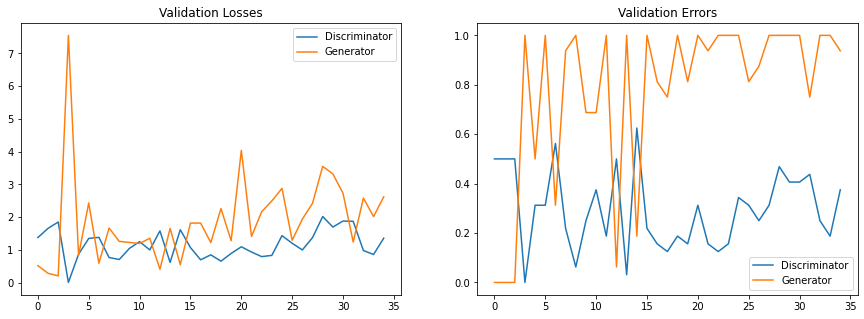

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 12.88it/s]


Epoch:  36/100 Discriminator Loss: 3.7347 Generator Loss: 7.4320


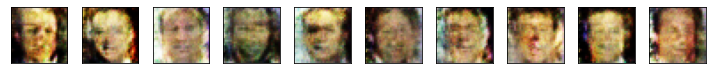

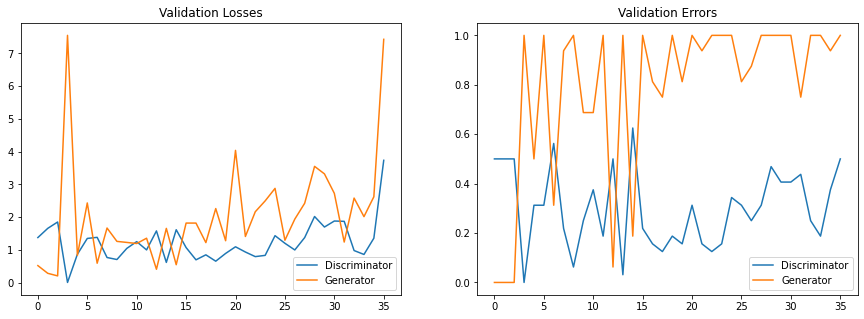

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 12.67it/s]


Epoch:  37/100 Discriminator Loss: 2.0851 Generator Loss: 3.0078


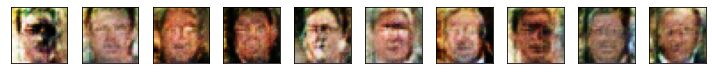

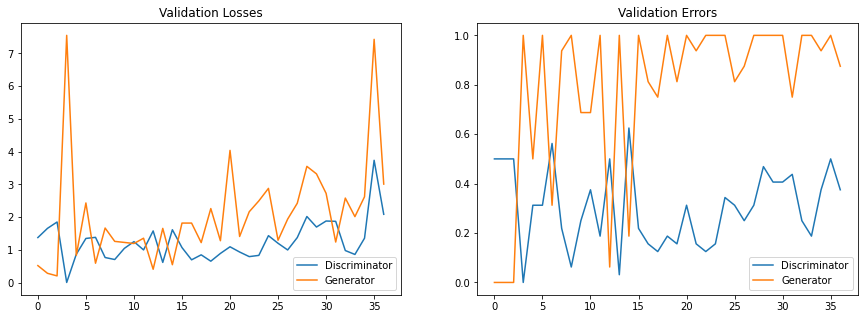

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 12.97it/s]


Epoch:  38/100 Discriminator Loss: 1.1897 Generator Loss: 0.8393


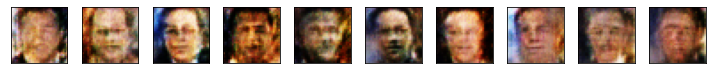

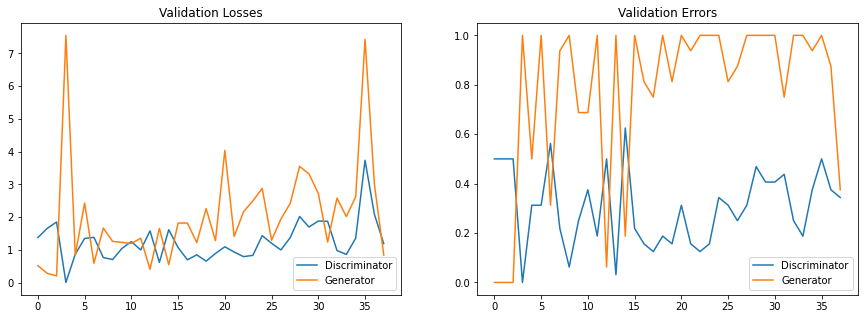

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 12.51it/s]


Epoch:  39/100 Discriminator Loss: 1.4777 Generator Loss: 2.8802


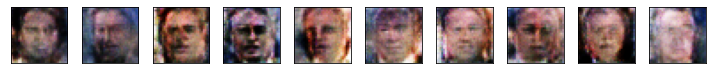

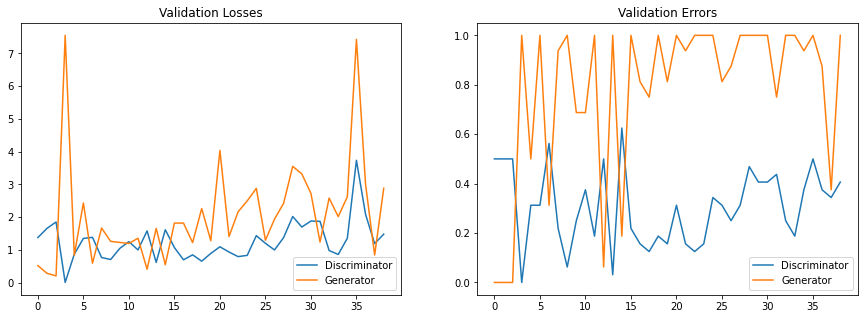

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 12.27it/s]


Epoch:  40/100 Discriminator Loss: 1.5277 Generator Loss: 2.1795


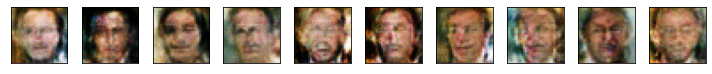

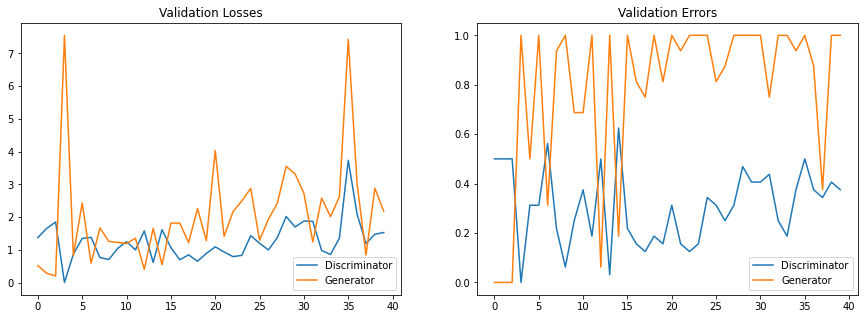

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 12.52it/s]


Epoch:  41/100 Discriminator Loss: 1.0472 Generator Loss: 1.1429


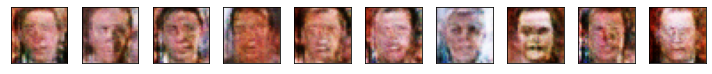

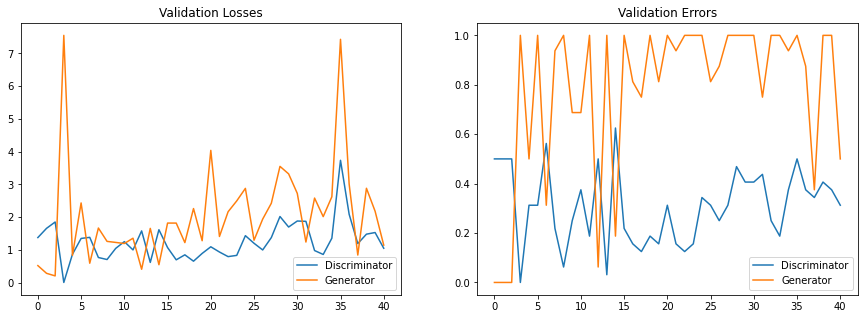

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 12.60it/s]


Epoch:  42/100 Discriminator Loss: 1.3839 Generator Loss: 0.5845


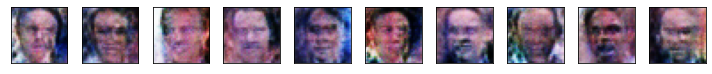

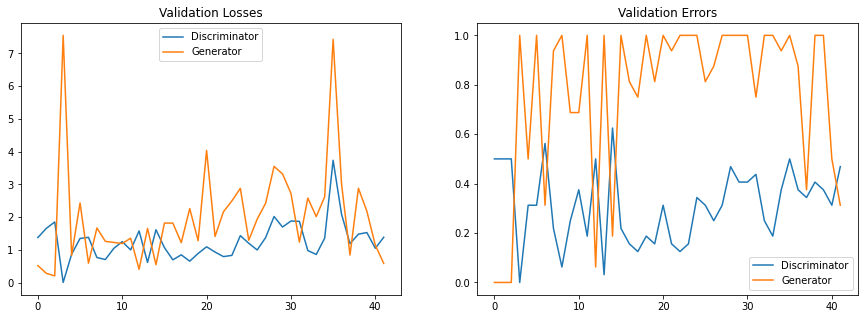

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 12.55it/s]


Epoch:  43/100 Discriminator Loss: 1.1150 Generator Loss: 3.1078


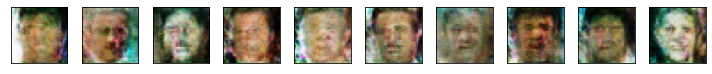

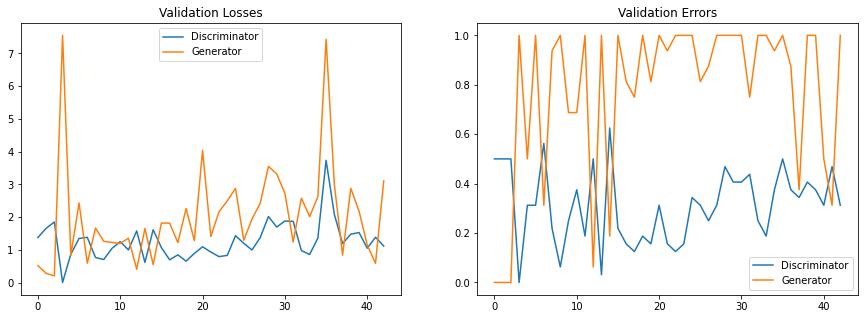

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 12.34it/s]


Epoch:  44/100 Discriminator Loss: 2.1236 Generator Loss: 1.5407


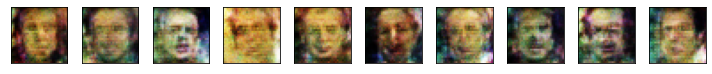

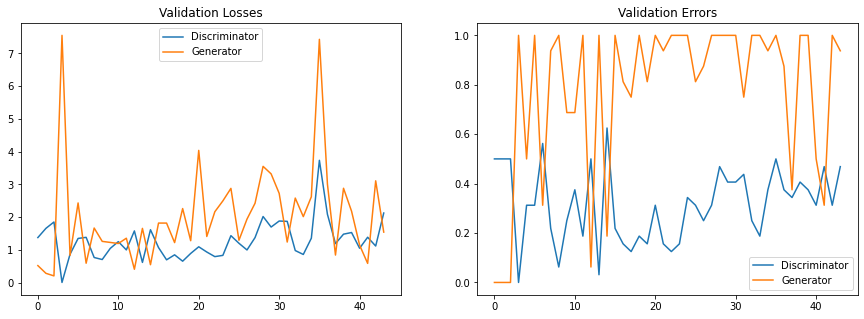

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 12.50it/s]


Epoch:  45/100 Discriminator Loss: 0.9622 Generator Loss: 3.0868


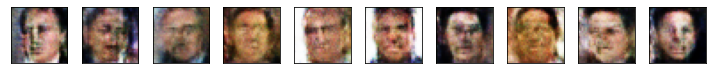

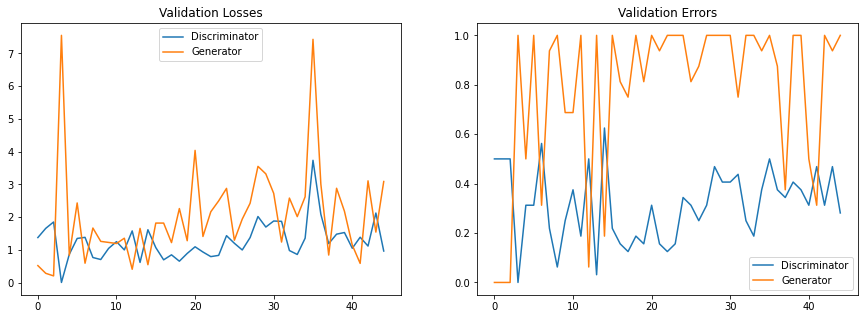

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 12.31it/s]


Epoch:  46/100 Discriminator Loss: 1.8814 Generator Loss: 2.9650


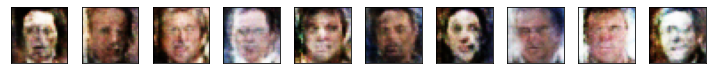

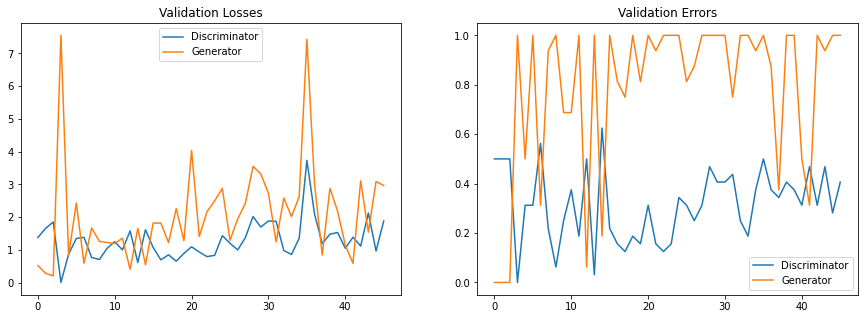

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 12.52it/s]


Epoch:  47/100 Discriminator Loss: 1.4532 Generator Loss: 1.8138


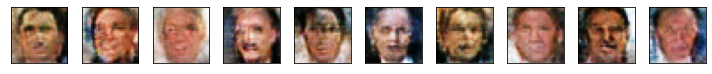

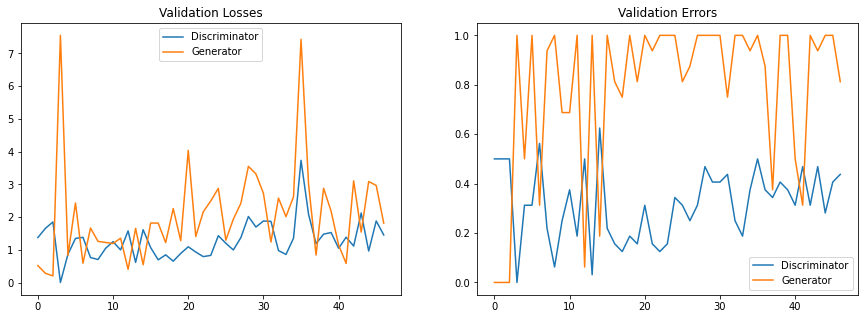

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 12.17it/s]


Epoch:  48/100 Discriminator Loss: 1.1669 Generator Loss: 1.9281


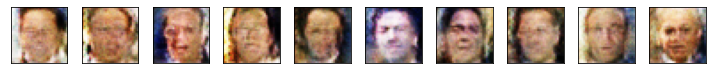

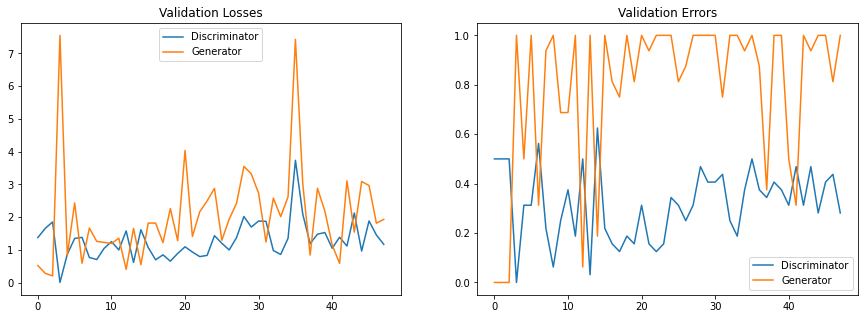

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 12.31it/s]


Epoch:  49/100 Discriminator Loss: 2.7897 Generator Loss: 3.9284


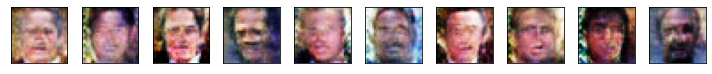

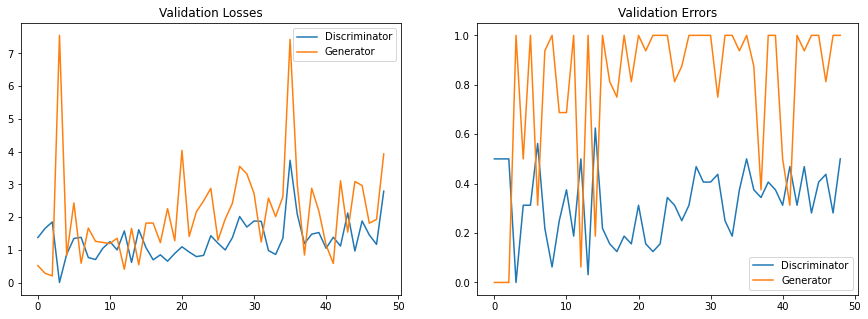

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 12.05it/s]


Epoch:  50/100 Discriminator Loss: 1.5350 Generator Loss: 1.5927


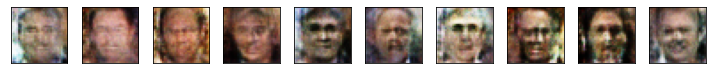

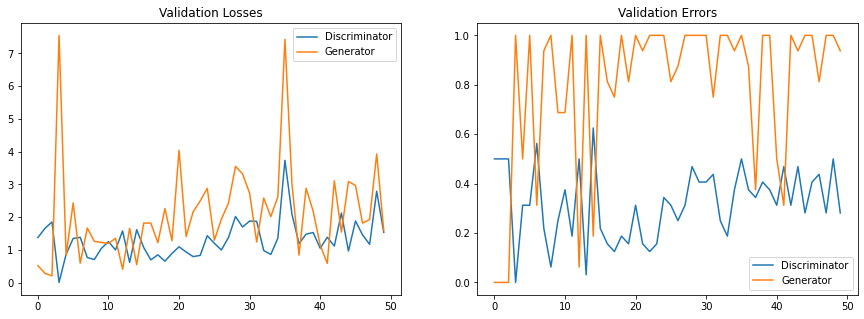

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 12.07it/s]


Epoch:  51/100 Discriminator Loss: 0.7684 Generator Loss: 1.2869


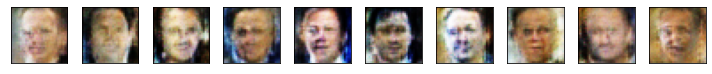

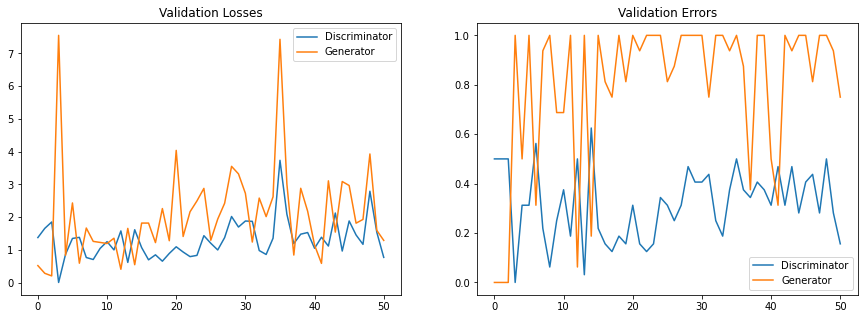

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 12.05it/s]


Epoch:  52/100 Discriminator Loss: 2.4712 Generator Loss: 2.1334


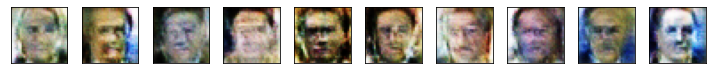

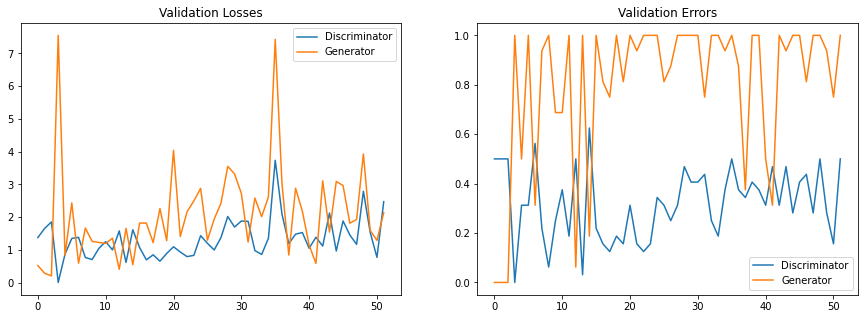

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 11.76it/s]


Epoch:  53/100 Discriminator Loss: 1.8118 Generator Loss: 1.4216


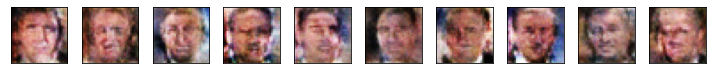

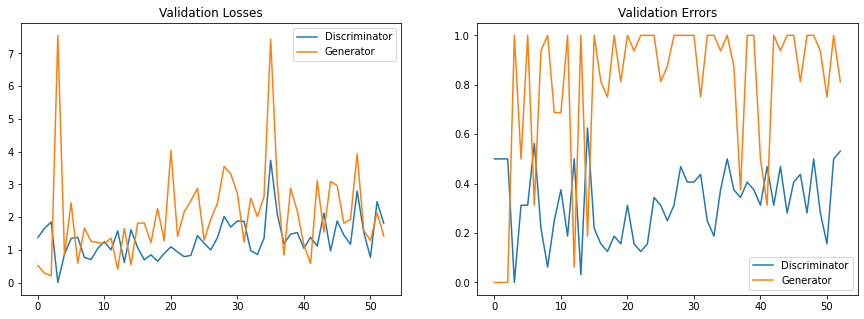

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 11.63it/s]


Epoch:  54/100 Discriminator Loss: 1.7449 Generator Loss: 2.4044


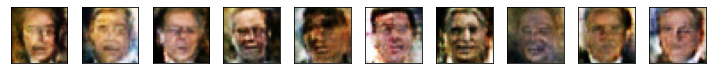

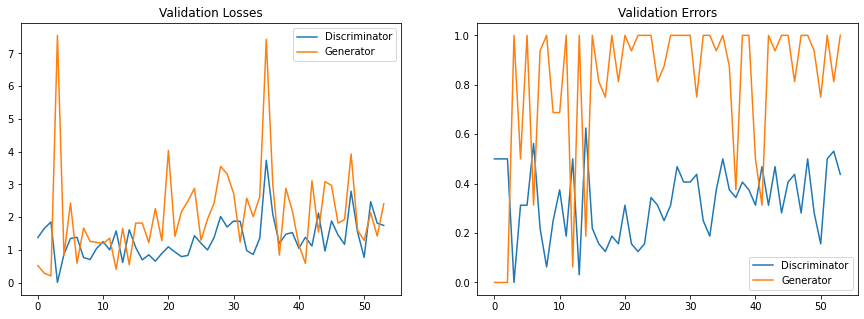

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 11.88it/s]


Epoch:  55/100 Discriminator Loss: 1.6723 Generator Loss: 2.5623


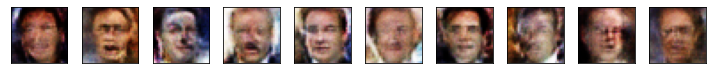

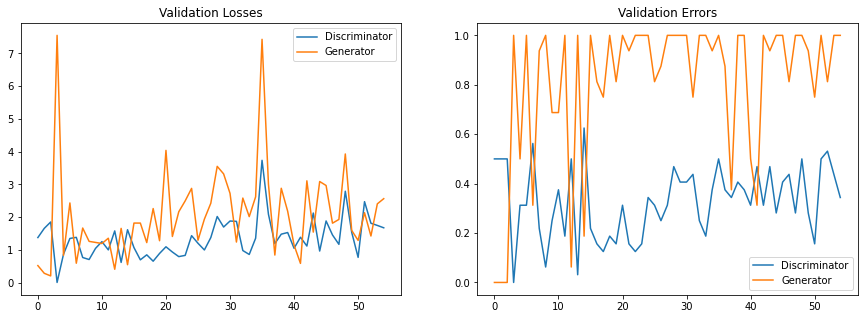

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 11.85it/s]


Epoch:  56/100 Discriminator Loss: 1.4787 Generator Loss: 2.6722


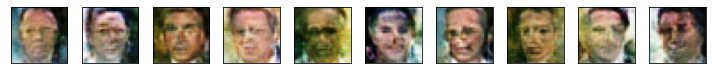

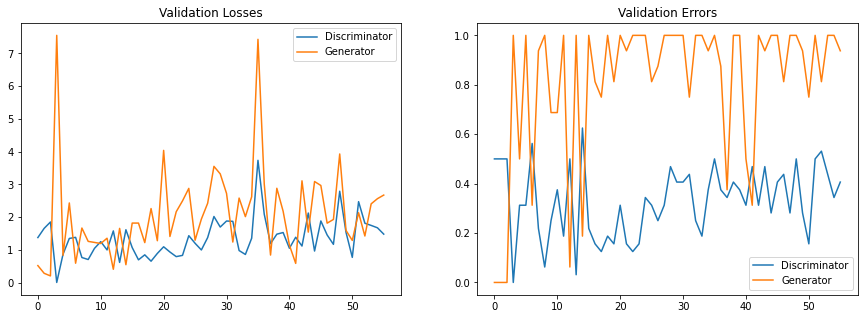

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 11.91it/s]


Epoch:  57/100 Discriminator Loss: 1.3900 Generator Loss: 1.6338


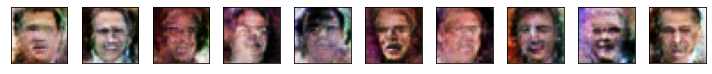

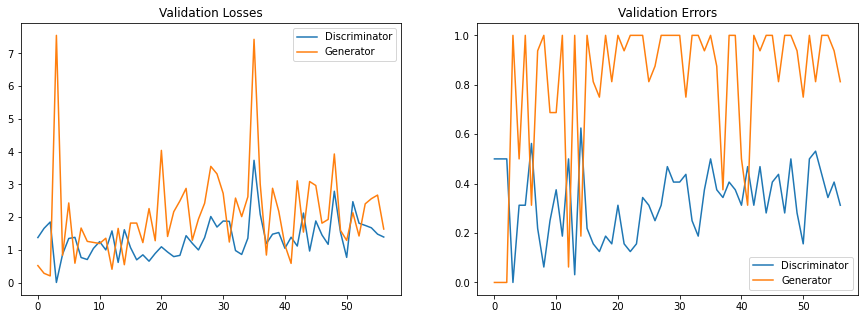

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 11.87it/s]


Epoch:  58/100 Discriminator Loss: 1.4720 Generator Loss: 1.8699


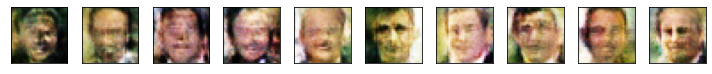

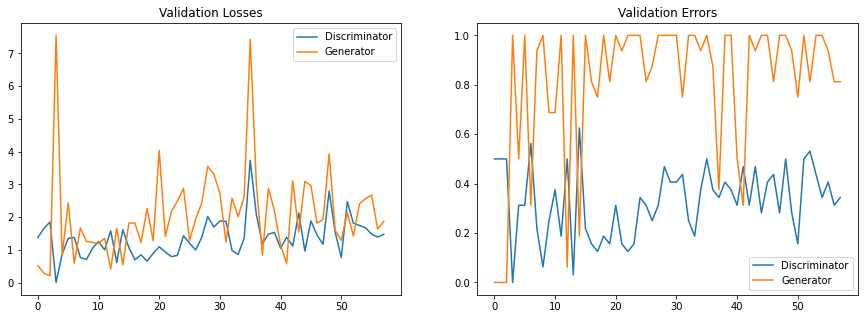

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 11.84it/s]


Epoch:  59/100 Discriminator Loss: 1.9907 Generator Loss: 4.0791


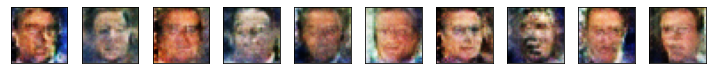

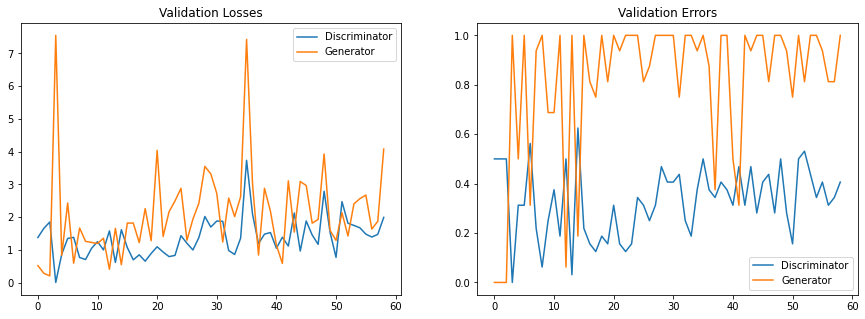

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 11.62it/s]


Epoch:  60/100 Discriminator Loss: 1.5674 Generator Loss: 2.6979


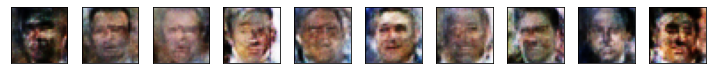

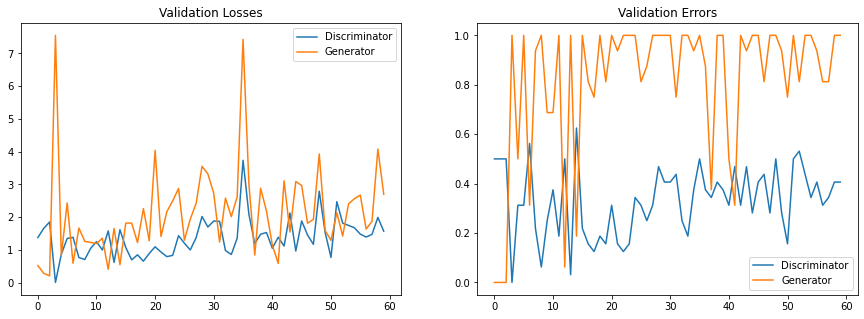

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 11.24it/s]


Epoch:  61/100 Discriminator Loss: 1.5470 Generator Loss: 2.5238


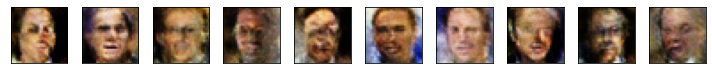

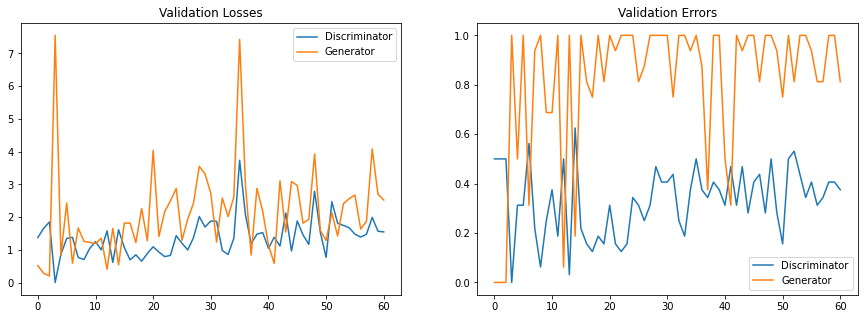

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 11.48it/s]


Epoch:  62/100 Discriminator Loss: 1.8246 Generator Loss: 1.7697


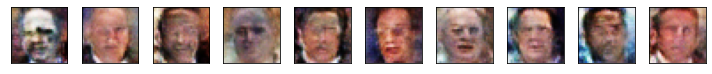

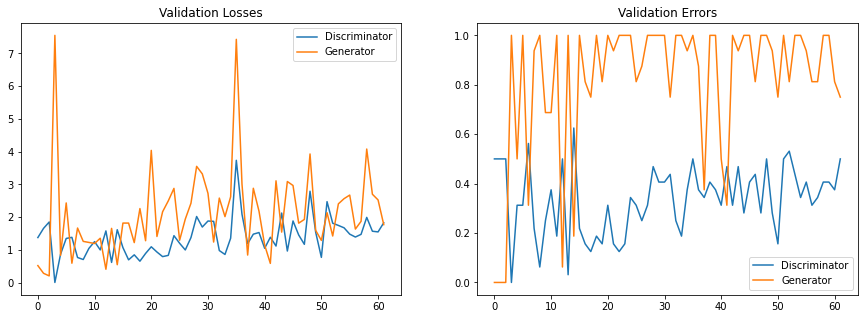

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 11.27it/s]


Epoch:  63/100 Discriminator Loss: 2.2963 Generator Loss: 3.5187


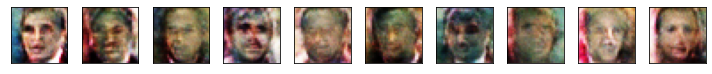

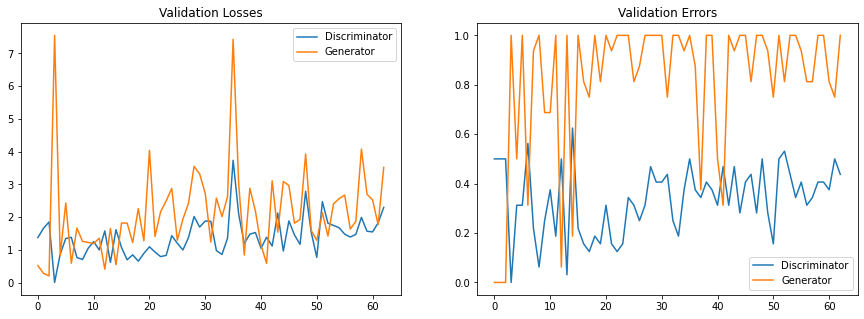

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 11.49it/s]


Epoch:  64/100 Discriminator Loss: 1.7493 Generator Loss: 1.9354


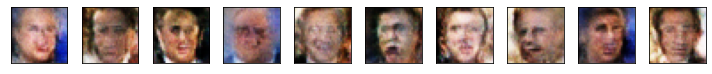

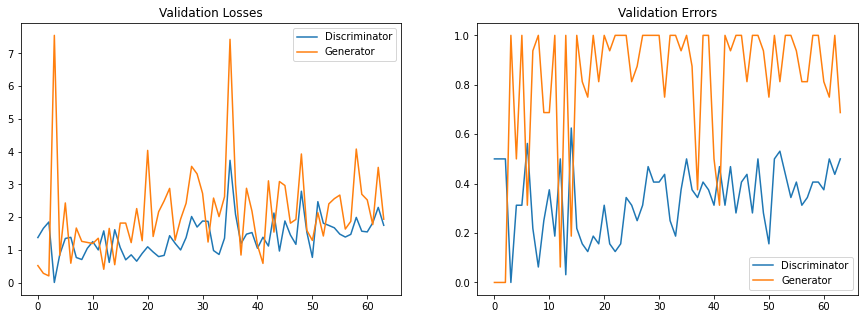

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 11.35it/s]


Epoch:  65/100 Discriminator Loss: 1.3465 Generator Loss: 2.2056


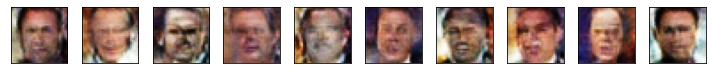

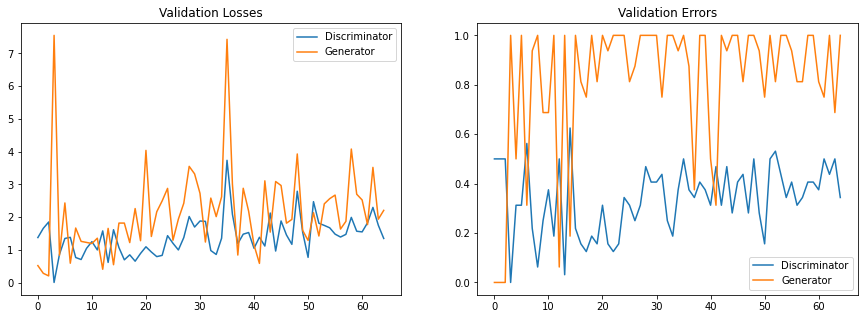

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 11.25it/s]


Epoch:  66/100 Discriminator Loss: 2.3275 Generator Loss: 1.6943


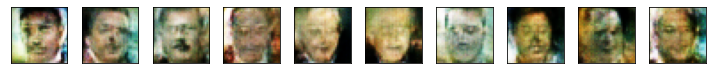

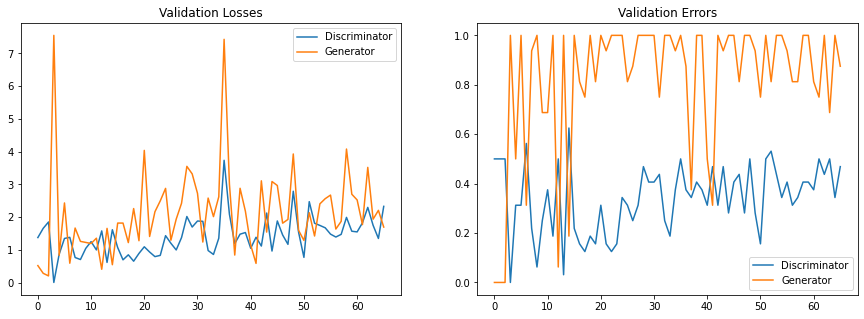

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 11.34it/s]


Epoch:  67/100 Discriminator Loss: 2.4499 Generator Loss: 2.6627


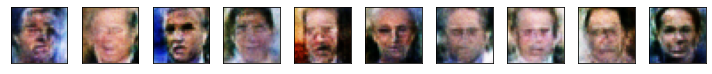

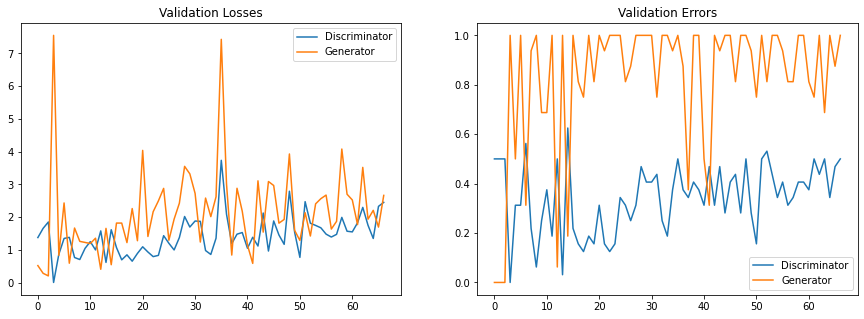

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.63it/s]


Epoch:  68/100 Discriminator Loss: 1.9097 Generator Loss: 3.0552


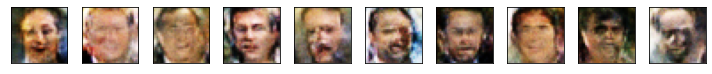

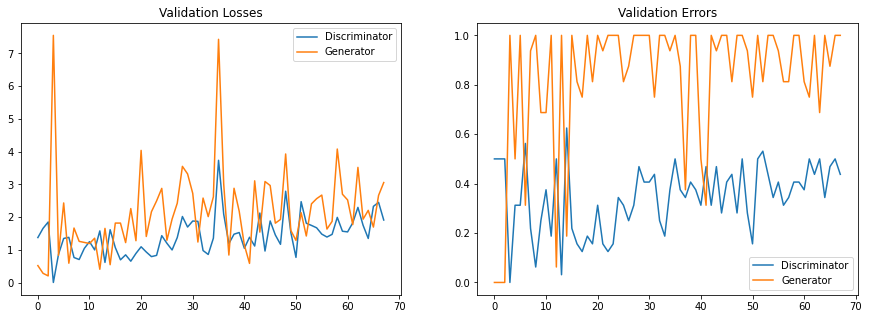

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.82it/s]


Epoch:  69/100 Discriminator Loss: 2.3378 Generator Loss: 2.1660


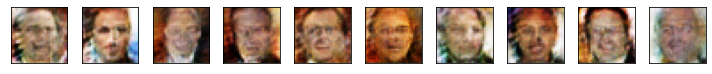

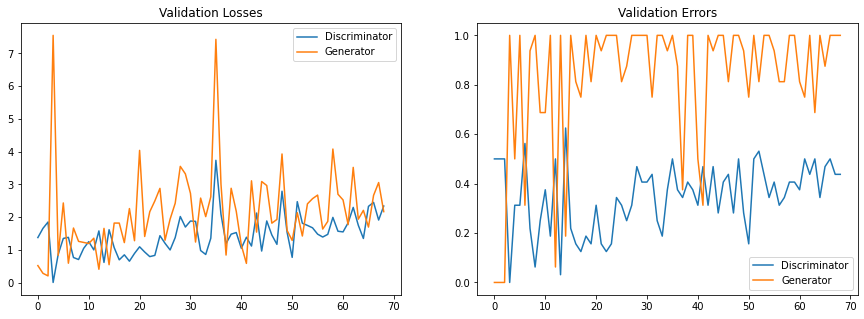

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:04<00:00, 11.06it/s]


Epoch:  70/100 Discriminator Loss: 1.6912 Generator Loss: 2.2497


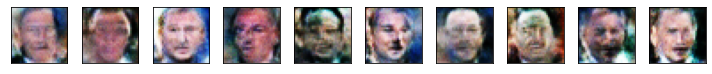

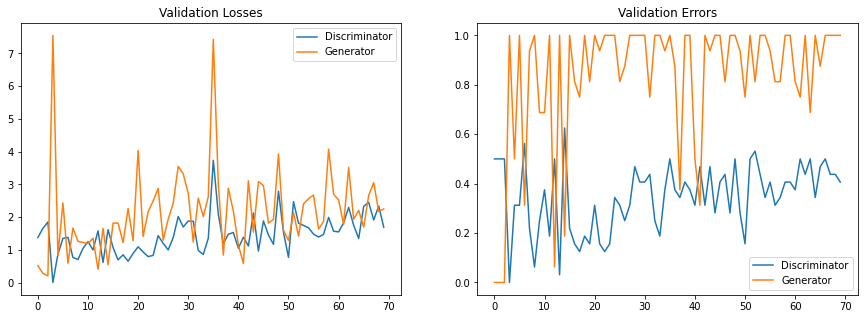

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.82it/s]


Epoch:  71/100 Discriminator Loss: 1.8285 Generator Loss: 2.6681


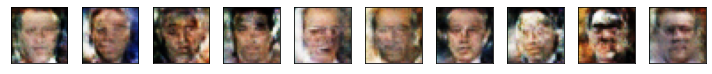

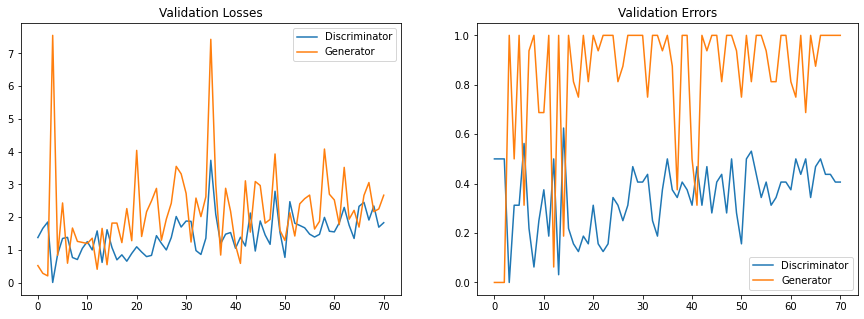

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.75it/s]


Epoch:  72/100 Discriminator Loss: 1.4083 Generator Loss: 1.9172


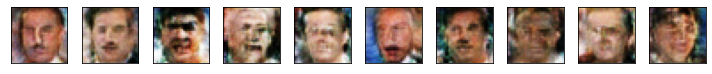

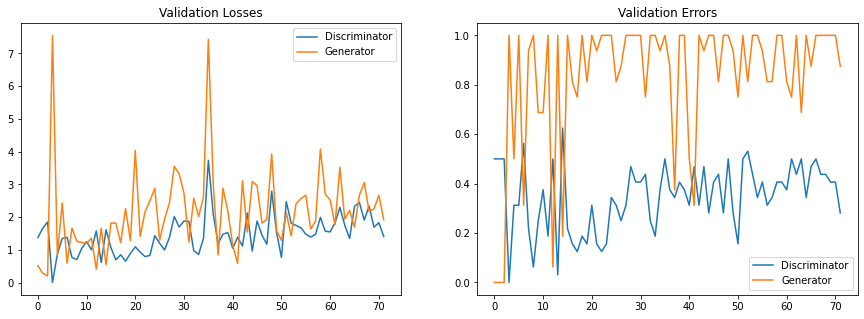

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.83it/s]


Epoch:  73/100 Discriminator Loss: 1.9547 Generator Loss: 3.1198


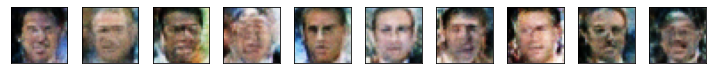

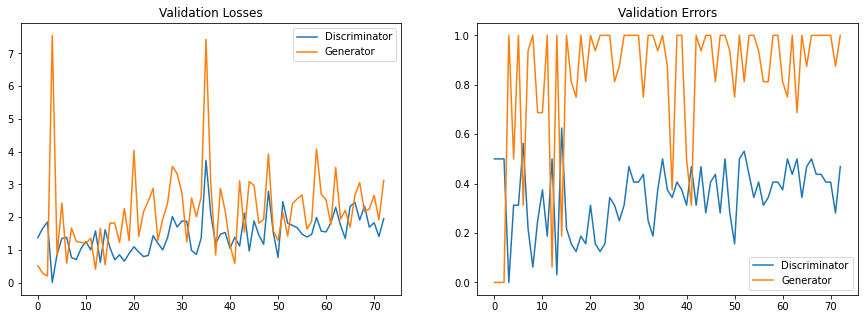

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.68it/s]


Epoch:  74/100 Discriminator Loss: 1.2237 Generator Loss: 1.4791


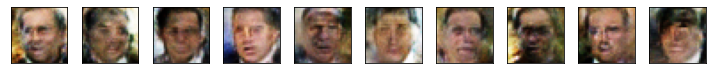

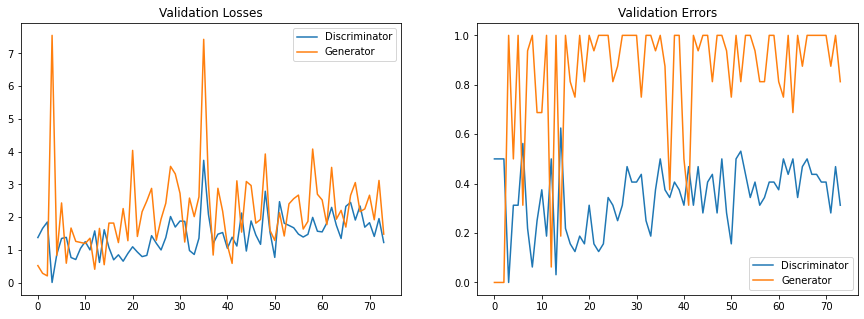

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.76it/s]


Epoch:  75/100 Discriminator Loss: 2.1675 Generator Loss: 3.0122


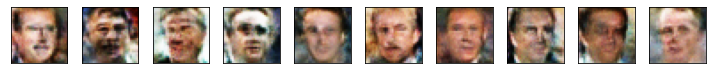

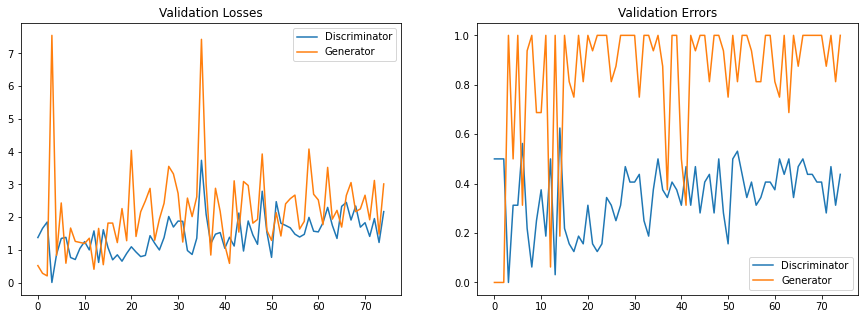

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.66it/s]


Epoch:  76/100 Discriminator Loss: 2.1058 Generator Loss: 3.2741


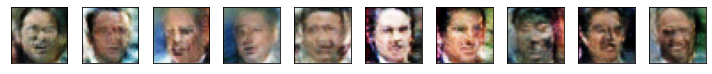

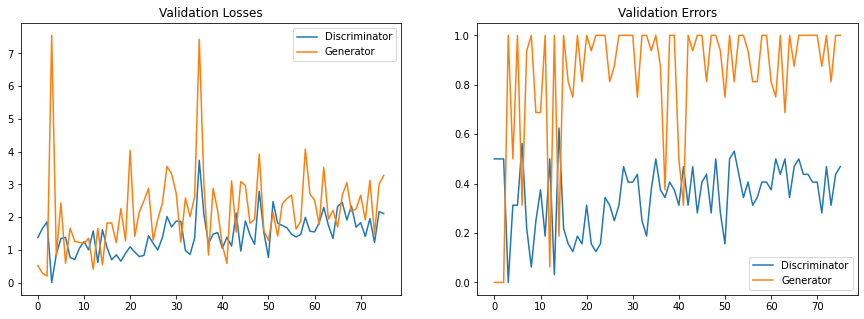

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00,  9.94it/s]


Epoch:  77/100 Discriminator Loss: 1.8845 Generator Loss: 2.9590


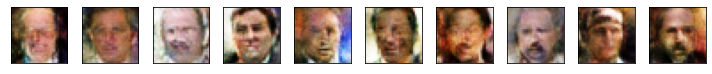

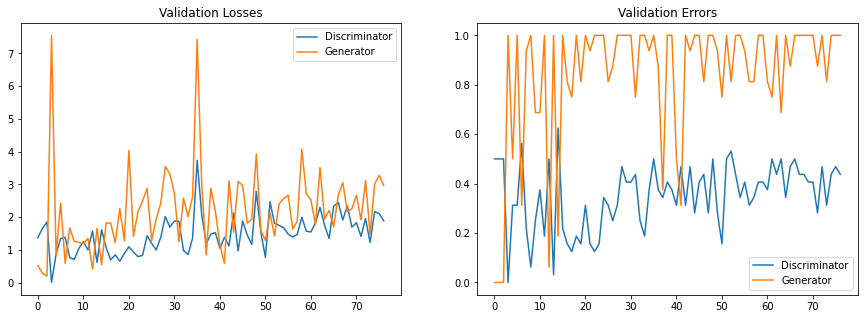

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.42it/s]


Epoch:  78/100 Discriminator Loss: 2.0526 Generator Loss: 1.6869


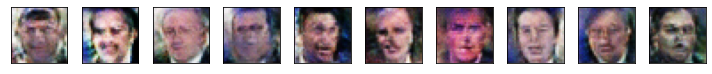

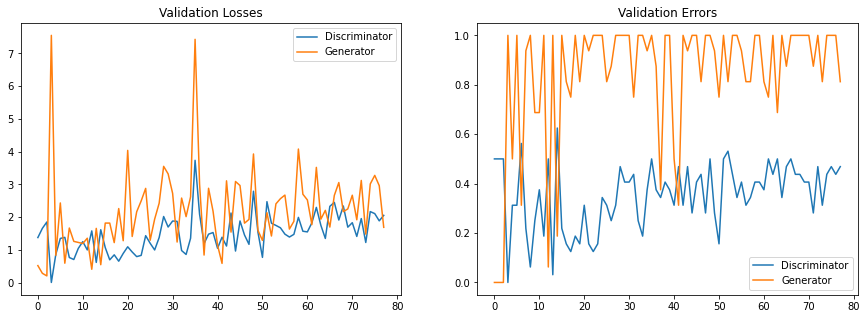

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.44it/s]


Epoch:  79/100 Discriminator Loss: 2.7144 Generator Loss: 3.0784


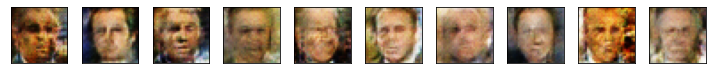

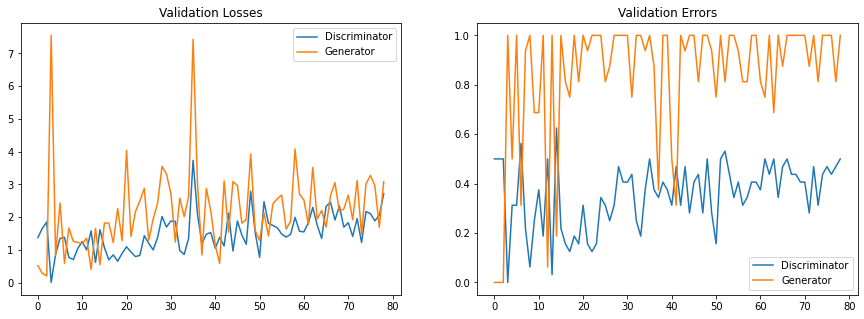

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.46it/s]


Epoch:  80/100 Discriminator Loss: 1.7164 Generator Loss: 2.6575


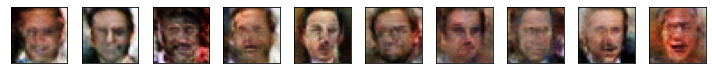

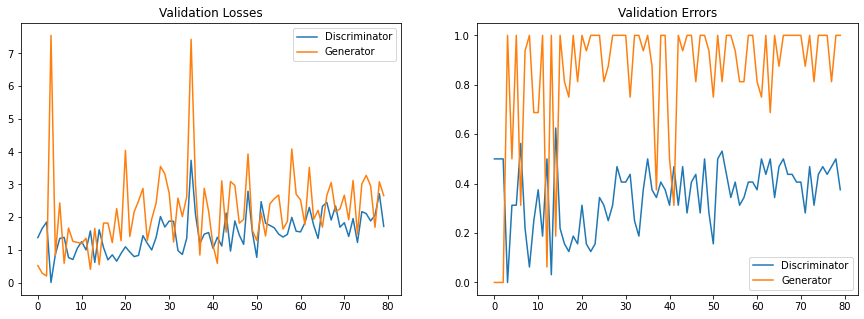

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.30it/s]


Epoch:  81/100 Discriminator Loss: 2.0316 Generator Loss: 3.0095


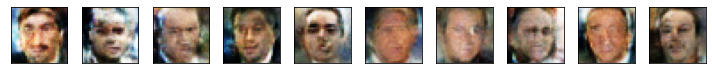

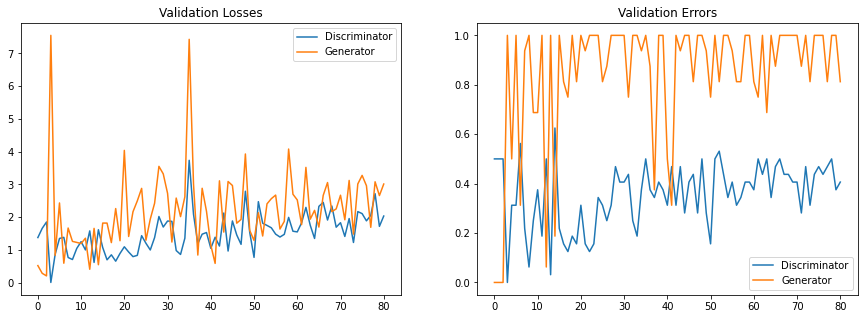

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.19it/s]


Epoch:  82/100 Discriminator Loss: 1.9044 Generator Loss: 3.0846


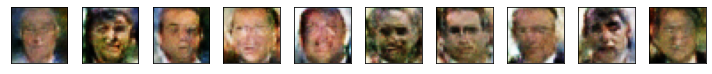

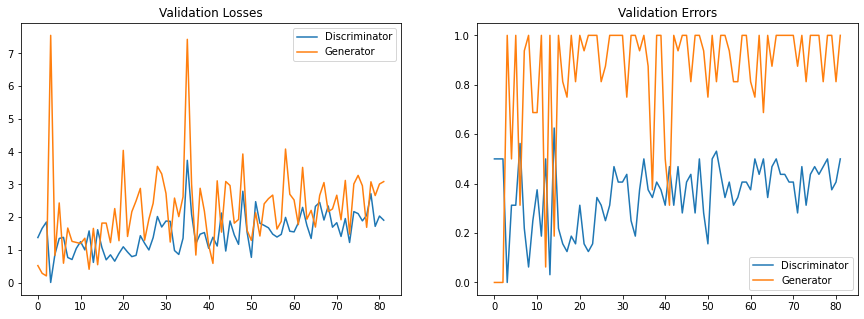

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.33it/s]


Epoch:  83/100 Discriminator Loss: 1.9395 Generator Loss: 2.4325


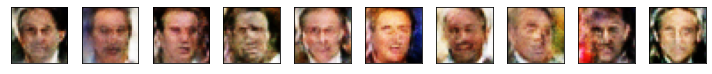

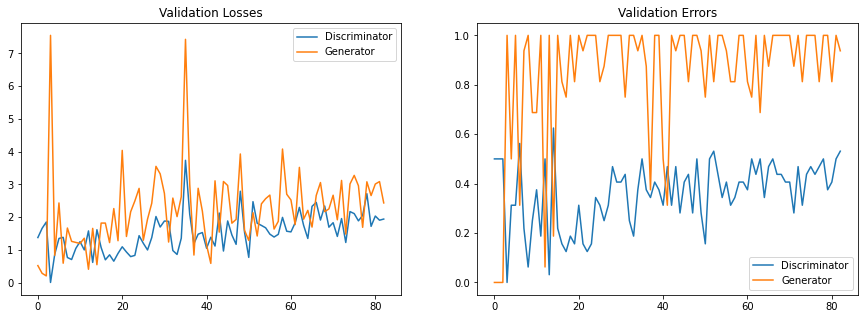

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.38it/s]


Epoch:  84/100 Discriminator Loss: 2.2827 Generator Loss: 2.6457


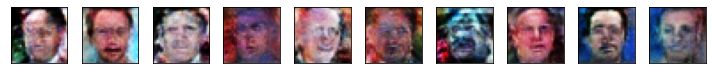

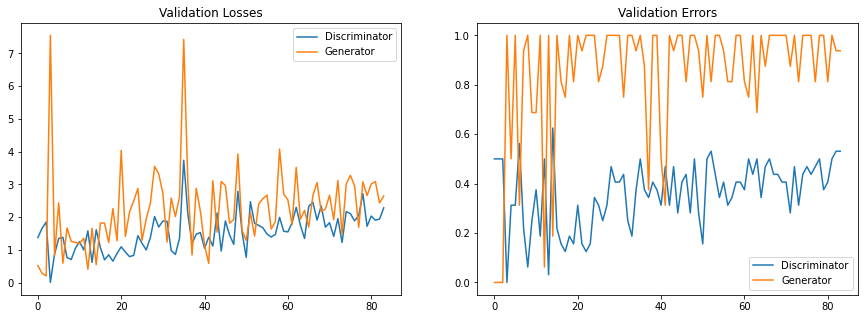

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.35it/s]


Epoch:  85/100 Discriminator Loss: 3.2338 Generator Loss: 4.2290


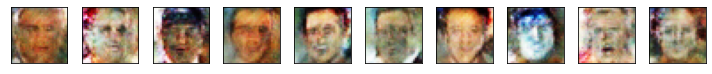

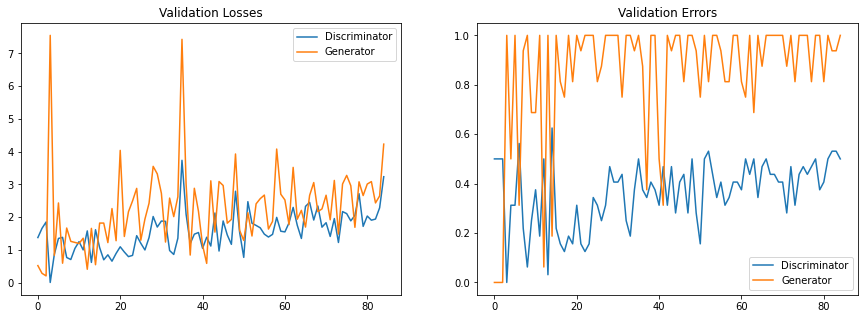

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.34it/s]


Epoch:  86/100 Discriminator Loss: 1.8255 Generator Loss: 3.1631


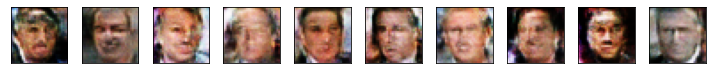

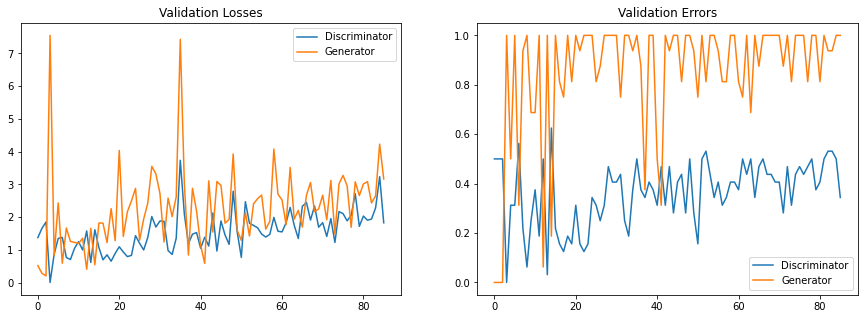

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.07it/s]


Epoch:  87/100 Discriminator Loss: 2.2769 Generator Loss: 3.0043


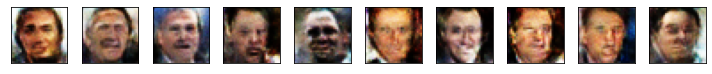

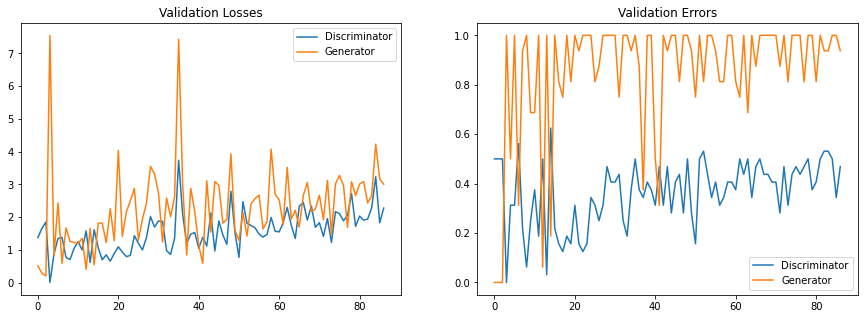

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.33it/s]


Epoch:  88/100 Discriminator Loss: 1.8915 Generator Loss: 2.3672


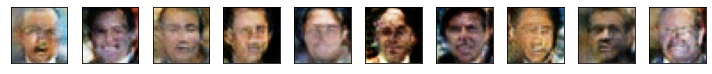

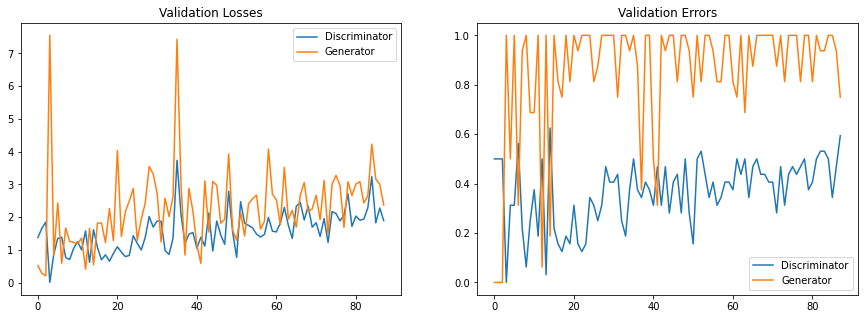

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.24it/s]


Epoch:  89/100 Discriminator Loss: 2.4335 Generator Loss: 2.3648


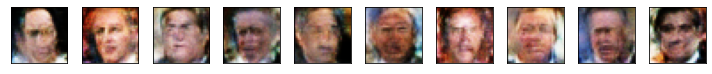

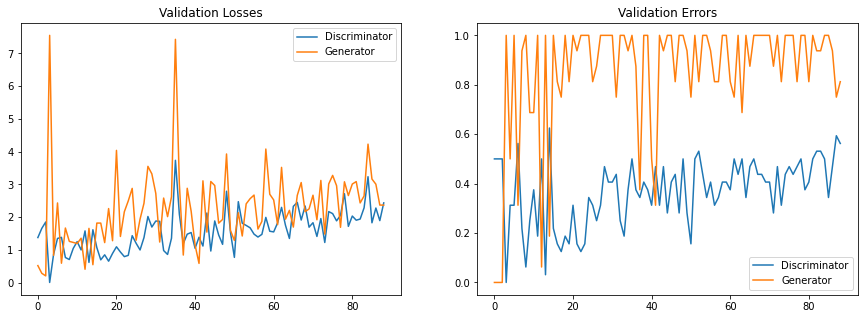

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.33it/s]


Epoch:  90/100 Discriminator Loss: 2.0159 Generator Loss: 2.8332


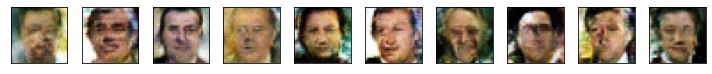

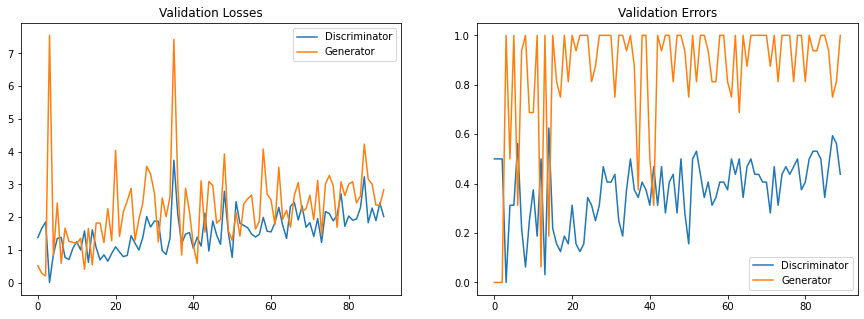

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00,  9.96it/s]


Epoch:  91/100 Discriminator Loss: 2.0593 Generator Loss: 2.6617


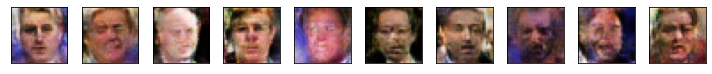

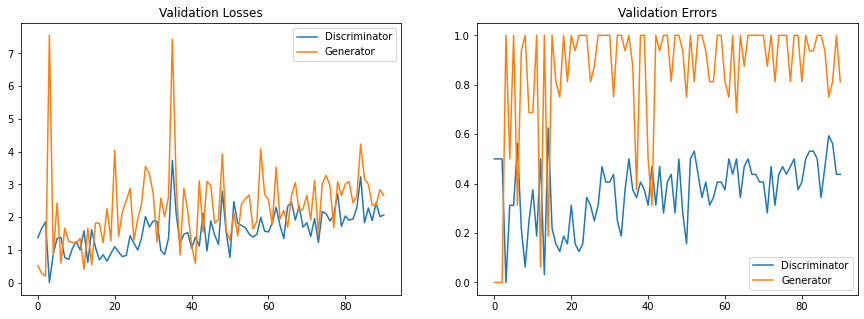

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.03it/s]


Epoch:  92/100 Discriminator Loss: 1.7003 Generator Loss: 2.2123


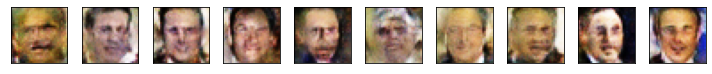

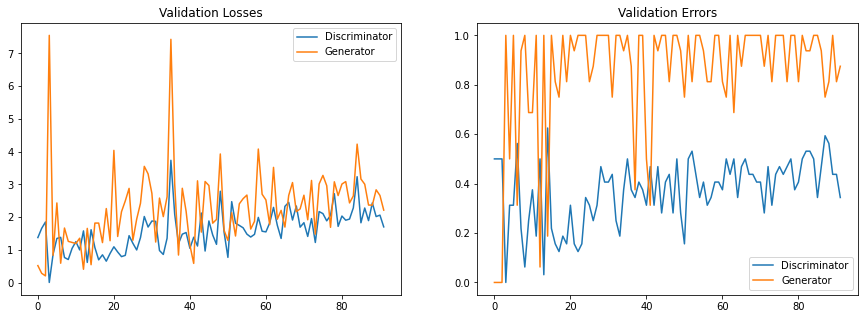

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.04it/s]


Epoch:  93/100 Discriminator Loss: 1.7692 Generator Loss: 2.4176


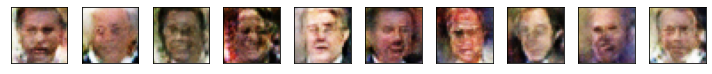

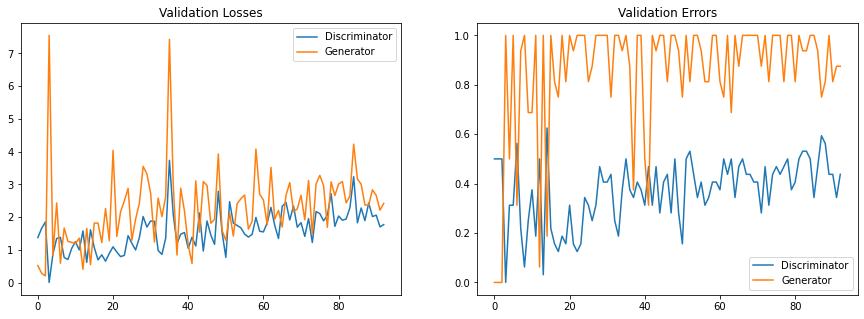

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00,  9.97it/s]


Epoch:  94/100 Discriminator Loss: 2.6661 Generator Loss: 3.1624


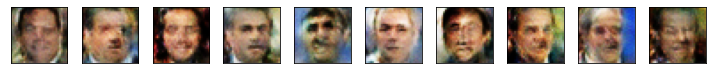

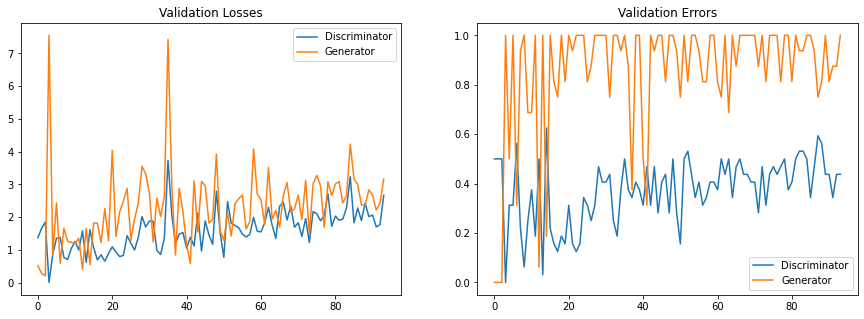

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.06it/s]


Epoch:  95/100 Discriminator Loss: 2.1690 Generator Loss: 2.7380


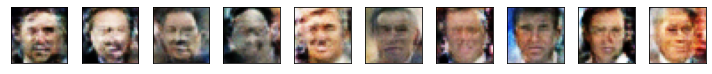

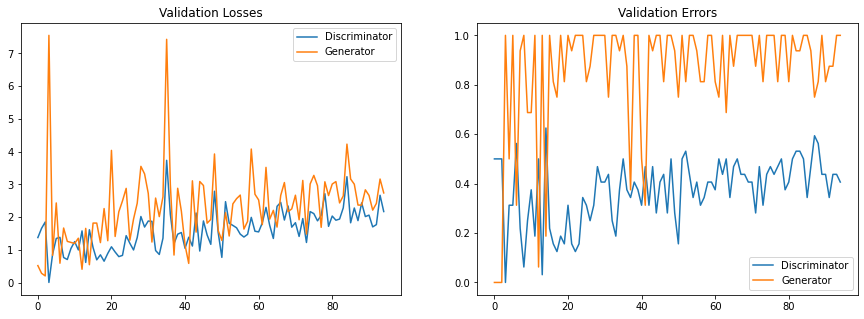

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.12it/s]


Epoch:  96/100 Discriminator Loss: 1.5431 Generator Loss: 2.1390


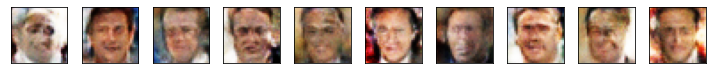

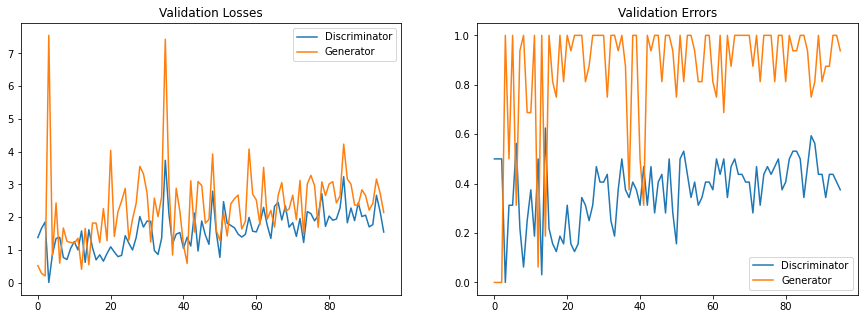

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00,  9.85it/s]


Epoch:  97/100 Discriminator Loss: 2.0499 Generator Loss: 2.4444


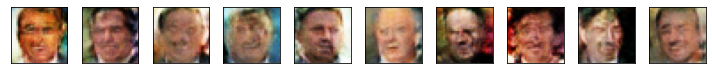

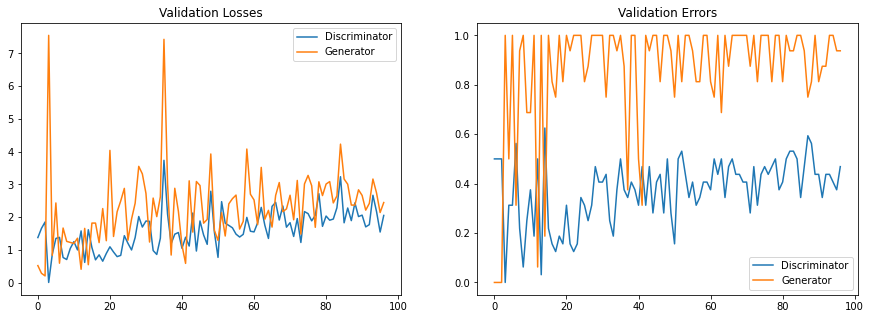

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00, 10.08it/s]


Epoch:  98/100 Discriminator Loss: 2.9171 Generator Loss: 3.3690


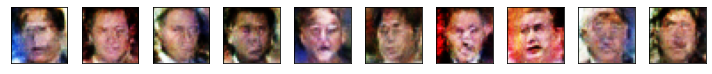

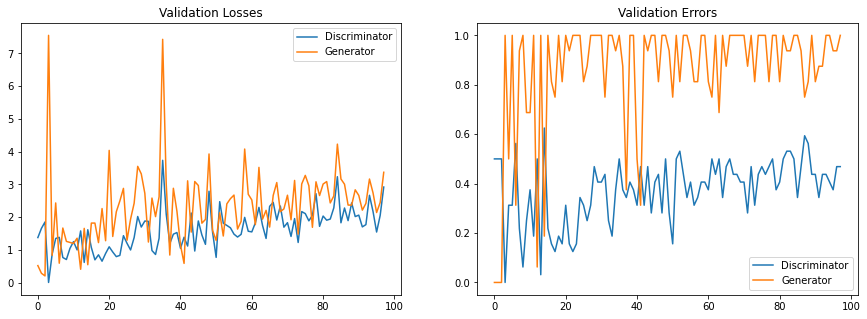

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00,  9.95it/s]


Epoch:  99/100 Discriminator Loss: 2.1675 Generator Loss: 3.0592


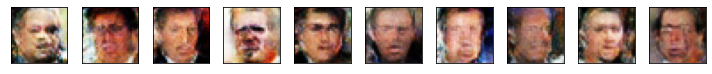

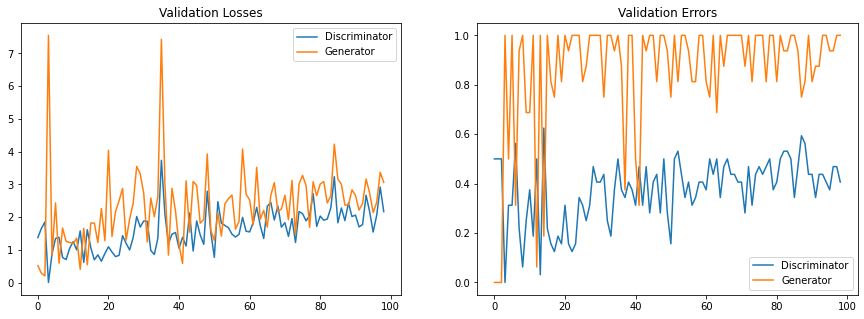

  0%|          | 0/55 [00:00<?, ?it/s]/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
100%|██████████| 55/55 [00:05<00:00,  9.92it/s]


Epoch: 100/100 Discriminator Loss: 2.2046 Generator Loss: 2.0533


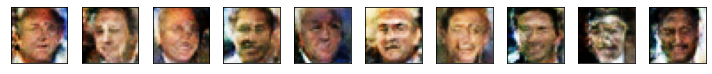

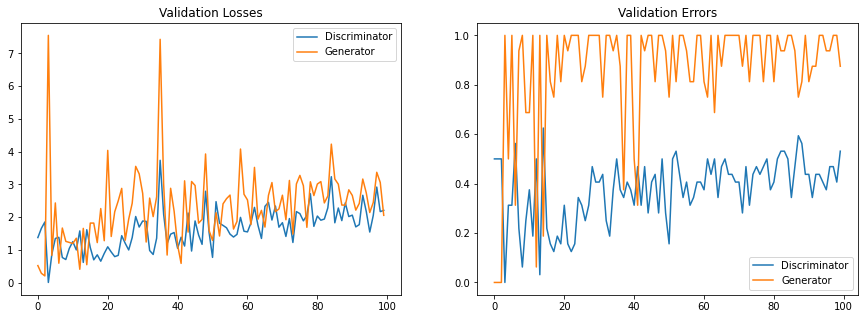

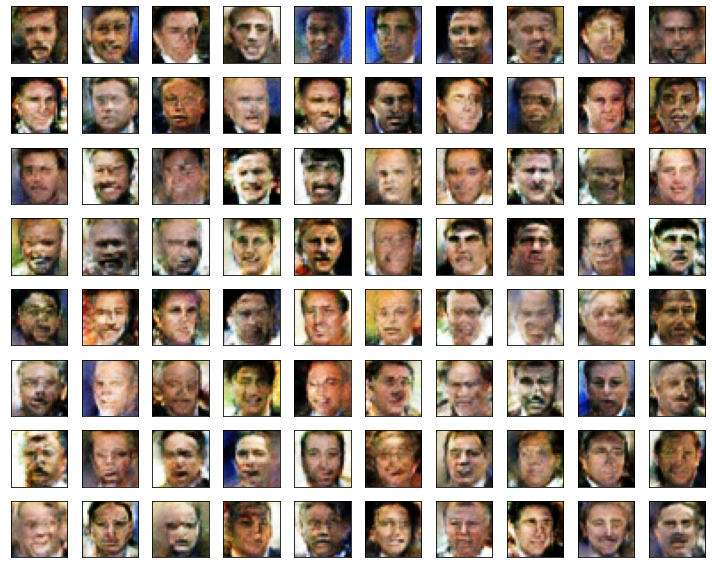

In [ ]:
if TRAIN:
    for e in range(epochs):
        for i in tqdm(range(len(X_train)//batch_size)):
            # real CelebA images
            X_batch = X_train[i*batch_size:(i+1)*batch_size]
            X_batch_real = np.array([preprocess(load_image(filename)) for filename in X_batch])

             # latent samples and the generated digit images
            latent_samples = make_latent_samples(batch_size, sample_size)
            X_batch_fake = generator.predict_on_batch(latent_samples)

            # train the discriminator to detect real and fake images
            make_trainable(discriminator, True)        
            discriminator.train_on_batch(X_batch_real, y_train_real * (1 - smooth))
            discriminator.train_on_batch(X_batch_fake, y_train_fake)

            # train the generator via GAN
            make_trainable(discriminator, False)
            gan.train_on_batch(latent_samples, y_train_real)

        # evaluate
        X_eval = X_test[np.random.choice(len(X_test), eval_size, replace=False)]
        X_eval_real = np.array([preprocess(load_image(filename)) for filename in X_eval])

        latent_samples = make_latent_samples(eval_size, sample_size)
        X_eval_fake = generator.predict_on_batch(latent_samples)

        d_loss  = discriminator.test_on_batch(X_eval_real, y_eval_real)
        d_loss += discriminator.test_on_batch(X_eval_fake, y_eval_fake)
        g_loss  = gan.test_on_batch(latent_samples, y_eval_real) # we want the fake to be realistic!

        losses.append((d_loss, g_loss))

        d_error = 0
        preds = discriminator.predict(X_eval_real).flatten().round()
        d_error += sum(preds!=y_eval_real[0][0])
        preds = discriminator.predict(X_eval_fake).flatten().round()
        d_error += sum(preds!=y_eval_fake[0][0])
        d_error /= (len(X_eval_real) + len(X_eval_fake))
        g_error = np.mean(gan.predict(latent_samples).flatten().round() != y_eval_real[0][0])

        errors.append((d_error, g_error))

        print("Epoch: {:>3}/{} Discriminator Loss: {:>6.4f} Generator Loss: {:>6.4f}".format(
            e+1, epochs, d_loss, g_loss))    
        show_images(X_eval_fake[:10])
        show_losses_and_errors(losses, errors)

    # show the result
    #show_losses(losses)
else:
    if COLAB:
        gdd.download_file_from_google_drive(file_id='1BbK3dG1O4LWPXN3ZniOPARJOoNClvTA9',
                                            dest_path='./discriminator_weights_1.h5', overwrite=True)
        gdd.download_file_from_google_drive(file_id='1rGu8vYbR4HoPoRZVstNtHjHRZuqjE4Qj',
                                            dest_path='./generator_weights_1.h5', overwrite=True)
    discriminator.load_weights("discriminator_weights_1.h5")
    generator.load_weights("generator_weights_1.h5")

show_images(generator.predict(make_latent_samples(80, sample_size)))

In [ ]:
#discriminator.save_weights("discriminator_weights_1.h5")
#generator.save_weights("generator_weights_1.h5")

In [ ]:
sample_size

100

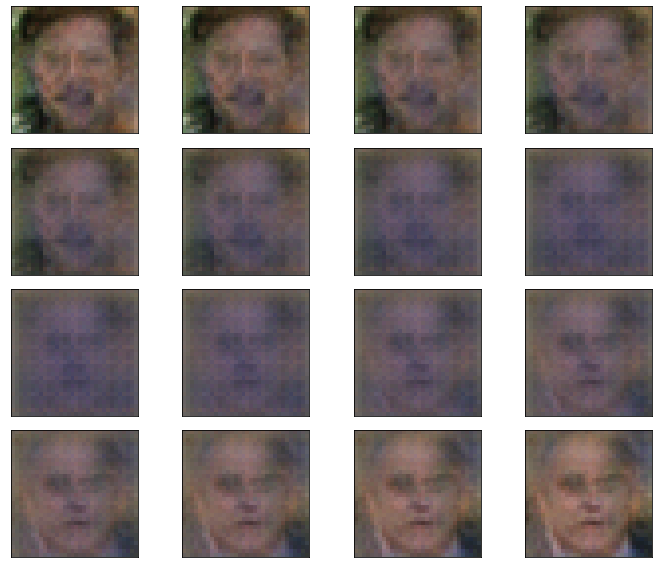

In [ ]:
N = 16
aux = np.zeros((N,100))
for i in range(10,11): # 10,11
    aux[:,i] = np.linspace(-5,5,N)
show_images(generator.predict(aux), cols=4)

In [ ]:
make_latent_samples(80, sample_size).shape

(80, 100)

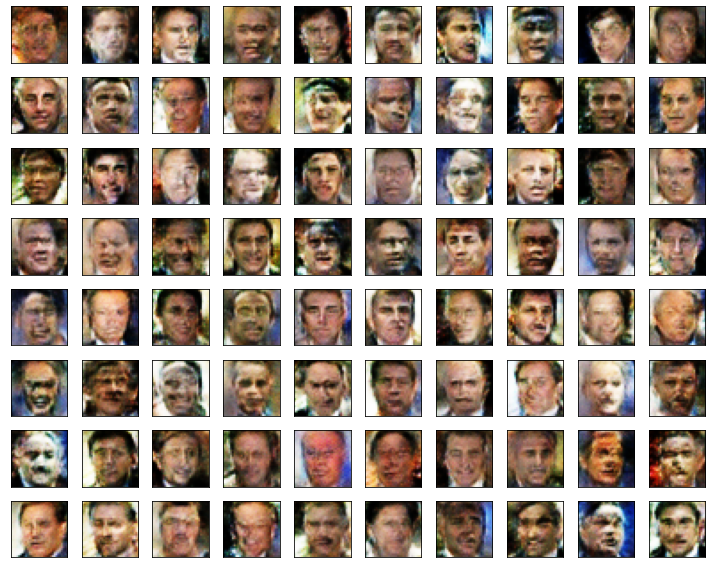

In [ ]:
show_images(generator.predict(make_latent_samples(80, sample_size)))

In [ ]:
generator.save("caras_famosos_generator.h5")
generator.save_weights("caras_famosos_generator_weights.h5")
discriminator.save("caras_famosos_discriminator.h5")
discriminator.save_weights("caras_famosos_discriminator_weights.h5")
gan.save("caras_famosos_gan.h5")
gan.save_weights("caras_famosos_gan_weights.h5")

In [ ]:
!ls -la

In [ ]:
if COLAB:
    from google.colab import files
    files.download('caras_famosos_generator.h5')
    files.download('caras_famosos_generator_weights.h5')
    files.download('caras_famosos_discriminator.h5')
    files.download('caras_famosos_discriminator_weights.h5')
    files.download('caras_famosos_gan.h5')
    files.download('caras_famosos_gan_weights.h5')